In [38]:
import pickle
import pandas as pd

with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_june_final.pkl", "rb") as f:
    scplus_obj = pickle.load(f)

In [16]:
import os

HOME          = os.path.expanduser("~")
WORK_DIR      = f"{HOME}/Downloads/Seurat_scATAC-seq"
INPUT_DIR     = f"{WORK_DIR}/scenicplus_input"
OUT_DIR       = f"{WORK_DIR}/scenicplus_output"
FRAGMENT_FILE = f"{WORK_DIR}/fragments.tsv.gz"

In [17]:
# Step 1: see everything stored in scplus_obj.uns
print(list(scplus_obj.uns.keys()))

['TF2G_importance', 'Region_to_gene', 'search_space']


In [18]:
# --- 1. TF → Region (enhancer) → Gene links ---
r2g = scplus_obj.uns['Region_to_gene']
print(r2g.columns.tolist())   # typically: region, gene, importance/score
print(r2g.head())

['Gene', 'Region', 'importance', 'rho']
            Gene                  Region  importance       rho
0  1110002O04Rik  chr1:35733168-35733668    0.021579 -0.021579
1  1110002O04Rik  chr1:35733932-35734432    0.021891 -0.021891
2  1110002O04Rik  chr1:35736232-35736732    0.016019 -0.016019
3  1110002O04Rik  chr1:35736831-35737331    0.003369 -0.003369
4  1110002O04Rik  chr1:35739716-35740216    0.023806 -0.023806


In [19]:
# Check if 'cistromes' exists and extract TF names
if 'cistromes' in scplus_obj.uns:
    # Get TFs from the 'direct' cistrome index
    tfs_in_cistromes = scplus_obj.uns['cistromes']['direct'].obs_names.tolist()
    
    # Intersect with the genes actually present in your expression matrix
    tfs = list(set(tfs_in_cistromes) & set(exp_mtx.columns))
    print(f"Found {len(tfs)} TFs to analyze.")
else:
    print("Cistromes not found. Please verify where your motif enrichment results are stored.")

Cistromes not found. Please verify where your motif enrichment results are stored.


In [20]:
print(type(scplus_obj.menr))          # should be a dict

<class 'dict'>


In [21]:
print(list(scplus_obj.menr.keys()))

['Layer 5/6 IT neurons_KO', 'Endothelial cells_KO', 'Deep-layer extratelencephalic neurons_Ctrl', 'SST+ interneurons_Ctrl', 'PV+ interneurons_KO', 'Layer 5a IT neurons_KO', 'Layer 4 sensory neurons_Ctrl', 'SST+ interneurons_KO', 'Layer 6a corticothalamic neurons_KO', 'Layer 4 sensory neurons_KO', 'Endothelial cells_Ctrl', 'PV+ interneurons_Ctrl', 'Layer 5a IT neurons_Ctrl', 'Microglia_KO', 'Deep-layer extratelencephalic neurons_KO', 'Layer 5b PT neurons_KO', 'Oligodendrocyte precursor cells_KO', 'VIP+ interneurons_KO', 'Astrocytes_KO', 'Layer 5/6 IT neurons_Ctrl', 'Layer 6b neurons_KO', 'Layer 6a corticothalamic neurons_Ctrl', 'VIP+ interneurons_Ctrl', 'Layer 2/3 IT neurons_KO', 'Oligodendrocytes_KO', 'Microglia_Ctrl', 'Oligodendrocytes_Ctrl', 'Meningeal fibroblasts_KO', 'Layer 5b PT neurons_Ctrl', 'Meningeal fibroblasts_Ctrl', 'Astrocytes_Ctrl', 'Layer 2/3 IT neurons_Ctrl', 'Oligodendrocyte precursor cells_Ctrl', 'Layer 6b neurons_Ctrl']


In [22]:
ct_key = list(scplus_obj.menr.keys())[0]
menr_entry = scplus_obj.menr[ct_key]

# It's a plain dict — see what keys it has
print(list(menr_entry.keys()))

# Then inspect the first key's value
first_key = list(menr_entry.keys())[0]
print("First key:", first_key)
print("Type of value:", type(menr_entry[first_key]))
print("Value sample:", menr_entry[first_key] if not hasattr(menr_entry[first_key], 'head') else menr_entry[first_key].head())

['ctx', 'dem']
First key: ctx
Type of value: <class 'pycistarget.motif_enrichment_cistarget.cisTargetDatabase'>
Value sample: <pycistarget.motif_enrichment_cistarget.cisTargetDatabase object at 0x35bd7cfd0>


In [23]:
ct_key = list(scplus_obj.menr.keys())[0]
ctx_obj = scplus_obj.menr[ct_key]['ctx']

# cisTargetDatabase has a .cistromes attribute — a dict of {TF: [regions]}
print(type(ctx_obj))
print(dir(ctx_obj))   # look for: cistromes, motif_enrichment, TF_cistromes

<class 'pycistarget.motif_enrichment_cistarget.cisTargetDatabase'>
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'db_rankings', 'load_db', 'regions_to_db', 'total_regions']


In [24]:
# Check what the DEM object looks like — it may have cistromes
dem_obj = scplus_obj.menr[ct_key]['dem']
print(type(dem_obj))
print(dir(dem_obj))

<class 'pycistarget.motif_enrichment_dem.DEMDatabase'>
['__abstractmethods__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_fname', '_name', 'ct_db', 'db_regions', 'fraction_overlap', 'genes', 'geneset', 'get_scores', 'load', 'load_full', 'name', 'total_genes']


In [25]:
# Check all top-level attributes of the scplus_obj
print([attr for attr in dir(scplus_obj) if not attr.startswith('_')])

# Specifically look for cistromes/motif enrichment results
for attr in dir(scplus_obj):
    if any(x in attr.lower() for x in ['cistrome', 'motif', 'enrich', 'tf2r', 'region']):
        print(attr, "→", type(getattr(scplus_obj, attr, None)))

['X_ACC', 'X_EXP', 'add_cell_data', 'add_gene_data', 'add_region_data', 'cell_names', 'dr_cell', 'dr_region', 'gene_names', 'menr', 'metadata_cell', 'metadata_genes', 'metadata_regions', 'n_cells', 'n_genes', 'n_regions', 'region_names', 'species', 'subset', 'to_df', 'uns']
_check_n_regions → <class 'method'>
_check_region_dimmensions → <class 'method'>
add_region_data → <class 'method'>
dr_region → <class 'dict'>
metadata_regions → <class 'pandas.core.frame.DataFrame'>
n_regions → <class 'int'>
region_names → <class 'pandas.core.indexes.base.Index'>


In [26]:
# Full uns keys again — may have gained entries
print(list(scplus_obj.uns.keys()))

# Check if there's a nested structure
for k, v in scplus_obj.uns.items():
    print(k, "→", type(v), "→", list(v.keys())[:3] if isinstance(v, dict) else str(v)[:80])

['TF2G_importance', 'Region_to_gene', 'search_space']
TF2G_importance → <class 'pandas.core.frame.DataFrame'> →                     TF         target  importance  regulation       rho
0       
Region_to_gene → <class 'pandas.core.frame.DataFrame'> →                   Gene                  Region  importance       rho
0        11
search_space → <class 'pandas.core.frame.DataFrame'> →                            Name           Gene   Distance
0        chr1:35733168


In [27]:
# Extract just the two small DataFrames immediately
tf2g = scplus_obj.uns['TF2G_importance'].copy()
r2g  = scplus_obj.uns['Region_to_gene'].copy()

# Free the large object from memory before merging
del scplus_obj
import gc; gc.collect()

print("TF2G shape:", tf2g.shape)
print("R2G shape:",  r2g.shape)

TF2G shape: (4687691, 5)
R2G shape: (4585095, 4)


In [31]:
# Determine correct column names dynamically to avoid KeyErrors
target_col = next((col for col in r2g.columns if col.lower() in ['target', 'gene']), None)
region_col = next((col for col in r2g.columns if col.lower() in ['region', 'peak']), None)

if target_col is None or region_col is None:
    print("Available columns in r2g:", r2g.columns.tolist())
    raise ValueError("Could not find the target/gene or region columns in the DataFrame.")

# Check how many regions map to a single gene — this is why it explodes
print(f"Using columns: '{target_col}' and '{region_col}'")
print("Avg regions per gene:", r2g.groupby(target_col)[region_col].count().mean())
print("Max regions per gene:", r2g.groupby(target_col)[region_col].count().max())

Using columns: 'Gene' and 'Region'
Avg regions per gene: 142.86455412226584
Max regions per gene: 1577


In [32]:
# Filter TF2G — top 10% importance, activating only
tf2g_filt = tf2g[
    (tf2g['rho'] > 0) &
    (tf2g['importance'] > tf2g['importance'].quantile(0.90))
].copy()

# Filter R2G — top 10% importance, positive correlation only
r2g_filt = r2g[
    (r2g['rho'] > 0) &
    (r2g['importance'] > r2g['importance'].quantile(0.90))
].copy()

print("Filtered TF2G:", tf2g_filt.shape)
print("Filtered R2G:",  r2g_filt.shape)

# Check avg regions per gene AFTER filtering
print("Avg regions per gene after filter:", 
      r2g_filt.groupby('Gene')['Region'].count().mean().round(1))

Filtered TF2G: (429113, 5)
Filtered R2G: (375656, 4)
Avg regions per gene after filter: 39.4


In [35]:
import numpy as np

# Filter TF2G — top 10% importance, activating only
tf2g_filt = tf2g[
    (tf2g['rho'] > 0) &
    (tf2g['importance'] > tf2g['importance'].quantile(0.90))
].copy()

# Filter R2G — top 10% importance, positive correlation only
r2g_filt = r2g[
    (r2g['rho'] > 0) &
    (r2g['importance'] > r2g['importance'].quantile(0.90))
].copy()

print("Filtered TF2G:", tf2g_filt.shape)
print("Filtered R2G:",  r2g_filt.shape)

# Check avg regions per gene AFTER filtering
print("Avg regions per gene after filter:", 
      r2g_filt.groupby('Gene')['Region'].count().mean().round(1))

# Dynamically map the correct column names for target/gene and region
tf_target_col = 'target' if 'target' in tf2g_filt.columns else 'Gene'
r2g_target_col = 'Gene' if 'Gene' in r2g_filt.columns else 'target'
r2g_region_col = 'Region' if 'Region' in r2g_filt.columns else 'region'

# Estimate merge size before actually doing it
# Count how many TF-gene pairs exist in tf2g_filt
tf_gene_pairs = tf2g_filt[['TF', tf_target_col]].drop_duplicates()
r2g_gene_counts = r2g_filt.groupby(r2g_target_col)[r2g_region_col].count()

# Expected rows = sum over each gene: (n_TFs for that gene) × (n_regions for that gene)
tf_per_gene = tf2g_filt.groupby(tf_target_col)['TF'].count()
common_genes = tf_per_gene.index.intersection(r2g_gene_counts.index)

expected_rows = (tf_per_gene[common_genes] * r2g_gene_counts[common_genes]).sum()
print(f"Expected triplet rows: {expected_rows:,}")
print(f"Estimated CSV size: ~{expected_rows * 150 / 1e9:.1f} GB")  # ~150 bytes per row

Filtered TF2G: (429113, 5)
Filtered R2G: (375656, 4)
Avg regions per gene after filter: 39.4
Expected triplet rows: 8,175,260
Estimated CSV size: ~1.2 GB


In [36]:
import gc

# ── 1. Determine the correct column names dynamically ──────────────────────────
tf_target_col = 'target' if 'target' in tf2g_filt.columns else 'Gene'
r2g_target_col = 'Gene' if 'Gene' in r2g_filt.columns else 'target'

# ── 2. Merge ───────────────────────────────────────────────────────────────────
# Use left_on and right_on to handle potential column name mismatches
triplets = tf2g_filt.merge(
    r2g_filt, 
    left_on=tf_target_col, 
    right_on=r2g_target_col, 
    how='inner', 
    suffixes=('_TF2G', '_R2G')
)
print("Raw triplets:", triplets.shape)

# If left_on and right_on are different, pandas keeps both columns. 
# We unify them under a single 'Target_Gene' column for consistency.
if tf_target_col != r2g_target_col:
    triplets['Target_Gene'] = triplets[tf_target_col]
    # Optionally drop the redundant columns to save memory
    triplets.drop(columns=[tf_target_col, r2g_target_col], inplace=True)
else:
    triplets.rename(columns={tf_target_col: 'Target_Gene'}, inplace=True)

# ── 3. Deduplicate — best region per TF-gene pair ──────────────────────────────
triplets_best = (triplets
    .sort_values('importance_R2G', ascending=False)
    .drop_duplicates(subset=['TF', 'Target_Gene'])
    .reset_index(drop=True))

# Clear the large raw triplets dataframe from memory
del triplets
gc.collect()

print("After dedup:", triplets_best.shape)

# ── 4. Save ────────────────────────────────────────────────────────────────────
out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets.csv"
triplets_best.to_csv(out, index=False)
print(f"Saved → {out}")

Raw triplets: (8175260, 9)
After dedup: (146868, 8)
Saved → /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets.csv


In [39]:
# Check all AUC results already stored
auc_keys = [k for k in scplus_obj.uns.keys() if 'AUC' in k or 'auc' in k.lower()]
print("AUC keys found:", auc_keys)



AUC keys found: []


In [40]:
print(scplus_obj.metadata_cell.index[:10].tolist())
print(scplus_obj.metadata_cell.columns.tolist())
print(scplus_obj.metadata_cell.head(10))

['Astrocytes_Ctrl_0', 'Astrocytes_Ctrl_1', 'Astrocytes_Ctrl_2', 'Astrocytes_Ctrl_3', 'Astrocytes_Ctrl_4', 'Astrocytes_Ctrl_5', 'Astrocytes_Ctrl_6', 'Astrocytes_Ctrl_7', 'Astrocytes_Ctrl_8', 'Astrocytes_Ctrl_9']
['ct_geno', 'genotype', 'cell_type']
                      ct_geno genotype   cell_type
Astrocytes_Ctrl_0  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_1  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_2  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_3  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_4  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_5  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_6  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_7  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_8  Astrocytes      NaN  Astrocytes
Astrocytes_Ctrl_9  Astrocytes      NaN  Astrocytes


In [41]:
# Print a broader sample including non-Astrocyte ones
print(scplus_obj.metadata_cell.index.tolist()[:30])

# Also test the regex directly on one barcode
import re
test = scplus_obj.metadata_cell.index[0]
print(f"Testing: '{test}'")
print(f"repr: {repr(test)}")  # check for hidden characters
print(re.search(r'_(Ctrl|KO)_\d+$', test))

# Check what unique suffixes exist after the last underscore
suffixes = scplus_obj.metadata_cell.index.str.extract(r'_([^_]+)_(\d+)$')
print(suffixes[0].value_counts())  # should show Ctrl, KO or whatever the actual strings are

['Astrocytes_Ctrl_0', 'Astrocytes_Ctrl_1', 'Astrocytes_Ctrl_2', 'Astrocytes_Ctrl_3', 'Astrocytes_Ctrl_4', 'Astrocytes_Ctrl_5', 'Astrocytes_Ctrl_6', 'Astrocytes_Ctrl_7', 'Astrocytes_Ctrl_8', 'Astrocytes_Ctrl_9', 'Astrocytes_Ctrl_10', 'Astrocytes_Ctrl_11', 'Astrocytes_Ctrl_12', 'Astrocytes_Ctrl_13', 'Astrocytes_Ctrl_14', 'Astrocytes_Ctrl_15', 'Astrocytes_Ctrl_16', 'Astrocytes_Ctrl_17', 'Astrocytes_Ctrl_18', 'Astrocytes_Ctrl_19', 'Astrocytes_Ctrl_20', 'Astrocytes_Ctrl_21', 'Astrocytes_KO_0', 'Astrocytes_KO_1', 'Astrocytes_KO_2', 'Astrocytes_KO_3', 'Astrocytes_KO_4', 'Astrocytes_KO_5', 'Astrocytes_KO_6', 'Astrocytes_KO_7']
Testing: 'Astrocytes_Ctrl_0'
repr: 'Astrocytes_Ctrl_0'
<re.Match object; span=(10, 17), match='_Ctrl_0'>
KO      1974
Ctrl     472
Name: 0, dtype: int64


In [42]:
import re

scplus_obj.metadata_cell['genotype'] = [
    re.search(r'_(Ctrl|KO)_\d+$', idx).group(1) 
    if re.search(r'_(Ctrl|KO)_\d+$', idx) else None
    for idx in scplus_obj.metadata_cell.index
]

scplus_obj.metadata_cell['cell_type'] = [
    re.sub(r'_(Ctrl|KO)_\d+$', '', idx)
    for idx in scplus_obj.metadata_cell.index
]

# Verify
print(scplus_obj.metadata_cell[['cell_type', 'genotype']].value_counts().head(20))
print("NaN genotypes:", scplus_obj.metadata_cell['genotype'].isna().sum())

cell_type                              genotype
Layer 4 sensory neurons                KO          408
Layer 5a IT neurons                    KO          362
Layer 5/6 IT neurons                   KO          200
Oligodendrocytes                       KO          196
Layer 6a corticothalamic neurons       KO          182
Astrocytes                             KO          158
Layer 4 sensory neurons                Ctrl        106
Layer 5a IT neurons                    Ctrl         88
PV+ interneurons                       KO           78
VIP+ interneurons                      KO           74
Deep-layer extratelencephalic neurons  KO           60
SST+ interneurons                      KO           58
Microglia                              KO           52
Layer 6a corticothalamic neurons       Ctrl         50
Layer 5/6 IT neurons                   Ctrl         46
Oligodendrocytes                       Ctrl         42
Oligodendrocyte precursor cells        KO           38
Layer 5b PT neuro

In [43]:
import os
import pickle
import pandas as pd
import numpy as np
import urllib.request

# ── Paths ─────────────────────────────────────────────────────────────────────
SCPLUS_PKL  = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno.pkl"
CHECKPOINT  = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_final_output_files/manual_signatures_checkpoint.pkl"
FURTHER_OUT = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
DEG_CSV     = os.path.join(FURTHER_OUT, "DEG_KO_vs_Ctrl", "DEG_all_celltypes_KO_vs_Ctrl.csv")
OVERLAP_OUT = os.path.join(FURTHER_OUT, "TF_DEG_overlap")
os.makedirs(OVERLAP_OUT, exist_ok=True)

TOP_N   = 5
N_PERMS = 10000
np.random.seed(42)

print("Loading DEGs...")
deg_all       = pd.read_csv(DEG_CSV)
sig_degs      = deg_all[deg_all["significant"] == True].copy()
sig_degs_up   = sig_degs[sig_degs["log2FC"] > 0]
sig_degs_down = sig_degs[sig_degs["log2FC"] < 0]
print(f"  Total sig DEGs: {len(sig_degs)}")


print("Loading checkpoint...")
with open(CHECKPOINT, "rb") as f:
    checkpoint = pickle.load(f)

tf2g_filtered = checkpoint["tf2g_filtered"].copy()
print(f"  tf2g_filtered shape: {tf2g_filtered.shape}")
print(f"  Columns: {tf2g_filtered.columns.tolist()}")

# Normalise column names
col_map = {}
for c in tf2g_filtered.columns:
    cl = c.lower()
    if cl in ("target", "gene"):         col_map[c] = "target"
    elif cl == "tf":                     col_map[c] = "TF"
    elif cl == "importance":             col_map[c] = "importance"
    elif cl in ("rho", "correlation"):   col_map[c] = "rho"
tf2g_filtered = tf2g_filtered.rename(columns=col_map)

# Ensure TF and target columns are strings and capitalized properly for mouse (Title case: Spi1)
if "TF" in tf2g_filtered.columns:
    tf2g_filtered["TF"] = tf2g_filtered["TF"].astype(str).str.capitalize()
if "target" in tf2g_filtered.columns:
    tf2g_filtered["target"] = tf2g_filtered["target"].astype(str).str.capitalize()

tf2g_pos = tf2g_filtered[tf2g_filtered["importance"] > 0.0].copy()

url = "https://raw.githubusercontent.com/aertslab/pySCENIC/master/resources/mm_mgi_tfs.txt"
with urllib.request.urlopen(url, timeout=10) as r:
    # Ensure known TFs are also Title Case to match
    known_tfs = set(x.capitalize() for x in r.read().decode().strip().split("\n"))
print(f"✅ Loaded {len(known_tfs)} mouse TFs")

# Minimum number of target genes a TF must have to be considered
MIN_TARGETS = 20

# Filter tf2g_pos to only TFs with enough targets
tf_target_counts = tf2g_pos.groupby("TF")["target"].nunique()
valid_tfs = set(tf_target_counts[tf_target_counts >= MIN_TARGETS].index)
print(f"  TFs with >= {MIN_TARGETS} targets: {len(valid_tfs)}")

# Rebuild tf2g_valid with the valid constraints and known TFs
tf2g_valid = tf2g_pos[
    tf2g_pos["TF"].isin(valid_tfs) &
    tf2g_pos["TF"].isin(known_tfs)
].copy()

print(f"TFs remaining: {tf2g_valid['TF'].nunique()}")
print(f"'Gpam' removed: {'Gpam' not in tf2g_valid['TF'].values}")
print(f"'Spi1' kept:    {'Spi1' in tf2g_valid['TF'].values}")
print(f"'Msi2' kept:    {'Msi2' in tf2g_valid['TF'].values}")

# ── Build specificity-weighted scores across all cell types ───────────────────
print(f"\nBuilding specificity-weighted top-{TOP_N} eRegulons per cluster...")

Loading DEGs...
  Total sig DEGs: 13201
Loading checkpoint...
  tf2g_filtered shape: (322927, 5)
  Columns: ['TF', 'target', 'importance', 'regulation', 'rho']
✅ Loaded 1721 mouse TFs
  TFs with >= 20 targets: 1646
TFs remaining: 1520
'Gpam' removed: False
'Spi1' kept:    True
'Msi2' kept:    True

Building specificity-weighted top-5 eRegulons per cluster...


In [44]:
import numpy as np
import pandas as pd

metadata = scplus_obj.metadata_cell.copy()
expdf    = scplus_obj.to_df("EXP")

# Standardize gene names in the expression matrix to match tf2g_valid (Mouse Title Case)
expdf.columns = expdf.columns.astype(str).str.capitalize()

MIN_ABSOLUTE_QUANTILE = 0.50
TOP_N = 5

all_ct_scores = {}
all_ct_tf2g   = {}

for ct in sorted(metadata["cell_type"].unique()):
    # Faster set intersection instead of slow list comprehension
    ct_cells = metadata.index[metadata["cell_type"] == ct].intersection(expdf.index)
    
    if len(ct_cells) < 5:
        continue

    ct_exp = expdf.loc[ct_cells].mean(axis=0)
    
    # Faster set difference to find 'other' cells instantly
    other_cells = expdf.index.difference(ct_cells)
    if len(other_cells) > 0:
        other_exp = expdf.loc[other_cells].mean(axis=0)
    else:
        other_exp = pd.Series(0, index=expdf.columns)

    tf2g_ct = tf2g_valid.copy()
    
    # Map using the strictly formatted target names
    tf2g_ct["target_exp"] = tf2g_ct["target"].map(ct_exp).fillna(0)
    tf2g_ct["other_exp"]  = tf2g_ct["target"].map(other_exp).fillna(0)
    
    # Calculate log2FC using pseudo-counts to avoid inf/-inf/NaN
    tf2g_ct["log2fc"]     = np.log2((tf2g_ct["target_exp"] + 1e-3) / (tf2g_ct["other_exp"] + 1e-3))
    tf2g_ct["weighted"]   = tf2g_ct["importance"] * tf2g_ct["target_exp"]

    all_ct_scores[ct] = tf2g_ct.groupby("TF")["weighted"].sum()
    all_ct_tf2g[ct]   = tf2g_ct

scores_df       = pd.DataFrame(all_ct_scores).fillna(0)
mean_across_cts = scores_df.mean(axis=1)

rows          = []
tf_assignment = {}

for ct in scores_df.columns:
    focal       = scores_df[ct]
    specificity = focal / (mean_across_cts + 1e-9)
    abs_threshold = focal.quantile(MIN_ABSOLUTE_QUANTILE)
    eligible    = specificity[focal >= abs_threshold]
    top_tfs     = eligible.sort_values(ascending=False).head(TOP_N).index.tolist()
    tf2g_ct     = all_ct_tf2g[ct]

    for tf in top_tfs:
        sig_name = f"{ct}_pos_manual_{tf}"
        tf_assignment[sig_name] = f"{tf} {ct}"
        top_genes = (
            tf2g_ct[
                (tf2g_ct["TF"] == tf) &
                (tf2g_ct["log2fc"] > 0.5)
            ]
            .sort_values("weighted", ascending=False)["target"]
            .unique()[:150]
            .tolist()
        )
        if not top_genes:
            print(f"  Warning: no CT-enriched genes (log2fc>0.5) for {tf} in {ct}, skipping")
            continue
            
        for g in top_genes:
            rows.append({
                "Gene_signature_name":   sig_name,
                "Gene":                  g,
                "Region_signature_name": sig_name,
                "Region":                g,
            })

    print(f"  {ct}: {top_tfs}")

df_multi = pd.DataFrame(rows)

if not df_multi.empty:
    print(f"\n✅ Total signatures: {df_multi['Gene_signature_name'].nunique()}")
else:
    print("\n❌ No signatures generated. The target genes might not overlap with expression data.")

  Astrocytes: ['Gli3', 'Rfx4', 'Gpam', 'Msi1', 'Prdm16']
  Deep-layer extratelencephalic neurons: ['Neurod1', 'Otx1', 'Ckmt1', 'Fezf2', 'Nr4a1']
  Endothelial cells: ['Zfp366', 'Mecom', 'Tbx1', 'Lef1', 'Sox18']
  Layer 2/3 IT neurons: ['Neurod1', 'Barx2', 'Dnajc21', 'Pparg', 'Lhx2']
  Layer 4 sensory neurons: ['Ovol2', 'Barx2', 'Neurod1', 'Dnajc21', 'Pparg']
  Layer 5/6 IT neurons: ['Osr1', 'Pou6f2', 'Ovol2', 'Egr1', 'Egr3']
  Layer 5a IT neurons: ['Neurod1', 'Barx2', 'Lhx2', 'Pparg', 'Emx1']
  Layer 5b PT neurons: ['Etv1', 'Nxph3', 'Hmga2', 'Tceal3', 'Otx1']
  Layer 6a corticothalamic neurons: ['Egr1', 'Pou6f2', 'Tbr1', 'Foxp2', 'Zfp831']
  Layer 6b neurons: ['Nr4a2', 'Pou6f2', 'Sox11', 'Nxph3', 'Ssbp3']
  Meningeal fibroblasts: ['Zic4', 'Tbx15', 'Tbx18', 'Zic1', 'Prdm6']
  Microglia: ['Spi1', 'Zfp710', 'Ikzf1', 'Irf5', 'Irf8']
  Oligodendrocyte precursor cells: ['E2f8', 'Rfx4', 'Traf4', 'Msi1', 'Prrx1']
  Oligodendrocytes: ['Creb5', 'Myrf', 'Klf12', 'Sox10', 'Nfe2l3']
  PV+ interneur

In [45]:
from scenicplus.eregulon_enrichment import score_eRegulons
import pickle

# ── Score eRegulons ───────────────────────────────────────────────────────────
print("\nScoring eRegulons (AUC)...")
auc_result_spec = score_eRegulons(
    eRegulons        = df_multi,
    gex_mtx          = scplus_obj.to_df("EXP"),
    acc_mtx          = scplus_obj.to_df("ACC"),
    auc_threshold    = 0.05,
    normalize        = False,
    n_cpu            = 4,
)
scplus_obj.uns["eRegulon_AUC_multi_spec"] = auc_result_spec


Scoring eRegulons (AUC)...


Less than 80% of the genes in Deep-layer extratelencephalic neurons_pos_manual_Neurod1 are present in the expression matrix.
Less than 80% of the genes in Astrocytes_pos_manual_Gli3 are present in the expression matrix.
Less than 80% of the genes in Layer 4 sensory neurons_pos_manual_Neurod1 are present in the expression matrix.
Less than 80% of the genes in Astrocytes_pos_manual_Gpam are present in the expression matrix.
Less than 80% of the genes in Layer 4 sensory neurons_pos_manual_Ovol2 are present in the expression matrix.
Less than 80% of the genes in Layer 6a corticothalamic neurons_pos_manual_Zfp831 are present in the expression matrix.
Less than 80% of the genes in Astrocytes_pos_manual_Msi1 are present in the expression matrix.
Less than 80% of the genes in Layer 4 sensory neurons_pos_manual_Pparg are present in the expression matrix.
Less than 80% of the genes in Astrocytes_pos_manual_Prdm16 are present in the expression matrix.
Less than 80% of the genes in Layer 6b neuron

In [46]:
# Save checkpoint immediately
checkpoint_new = {
    "tf2g_filtered":   tf2g_filtered,
    "df_multi":        df_multi,
    "tf_assignment":   tf_assignment,
    "auc_result_spec": auc_result_spec,
}
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "wb") as f:
    pickle.dump(checkpoint_new, f)

# Store in object and save
scplus_obj.uns["eRegulon_AUC_multi_spec"] = auc_result_spec
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final.pkl", "wb") as f:
    pickle.dump(scplus_obj, f)

print("✅ Saved checkpoint and scplus_obj — you won't need to rerun scoring again")

print("✅ AUC saved to both checkpoint and scplus_obj")
print(f"Gene-based AUC shape: {auc_result_spec['Gene_based'].shape}")

✅ Saved checkpoint and scplus_obj — you won't need to rerun scoring again
✅ AUC saved to both checkpoint and scplus_obj
Gene-based AUC shape: (2446, 85)


In [48]:
# Load checkpoint
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "rb") as f:
    ckpt = pickle.load(f)
    
df_multi       = ckpt["df_multi"]
tf_assignment  = ckpt["tf_assignment"]
auc_result     = ckpt["auc_result_spec"]

In [49]:
# Load triplets
triplets = pd.read_csv("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets.csv")

In [50]:
# Load metadata (only need metadata, not full object)
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final.pkl", "rb") as f:
    scplus_obj = pickle.load(f)

meta = scplus_obj.metadata_cell[["cell_type", "genotype"]].copy()
del scplus_obj
import gc; gc.collect()

print("Triplets shape:", triplets.shape)
print("Triplets columns:", triplets.columns.tolist())
print("AUC Gene-based shape:", auc_result["Gene_based"].shape)

Triplets shape: (146868, 8)
Triplets columns: ['TF', 'importance_TF2G', 'regulation', 'rho_TF2G', 'Region', 'importance_R2G', 'rho_R2G', 'Target_Gene']
AUC Gene-based shape: (2446, 85)


In [51]:
auc_gb = auc_result["Gene_based"].copy()
auc_gb = auc_gb.join(meta, how="inner")

mean_auc = (auc_gb
    .groupby(["cell_type", "genotype"])
    .mean()
    .reset_index()
)

# Melt to long form: cell_type | genotype | signature | mean_AUC
mean_auc_long = mean_auc.melt(
    id_vars=["cell_type", "genotype"],
    var_name="signature",
    value_name="mean_AUC"
)

# Map signature → TF name using tf_assignment
# tf_assignment: {sig_name: "TF celltype"} → extract TF
mean_auc_long["TF"] = mean_auc_long["signature"].map(
    {k: v.split()[0] for k, v in tf_assignment.items()}
)
mean_auc_long["sig_cell_type"] = mean_auc_long["signature"].map(
    {k: " ".join(v.split()[1:]) for k, v in tf_assignment.items()}
)

print(mean_auc_long.head(10))

                               cell_type genotype                   signature  \
0                             Astrocytes     Ctrl  Astrocytes_pos_manual_Gli3   
1                             Astrocytes       KO  Astrocytes_pos_manual_Gli3   
2  Deep-layer extratelencephalic neurons     Ctrl  Astrocytes_pos_manual_Gli3   
3  Deep-layer extratelencephalic neurons       KO  Astrocytes_pos_manual_Gli3   
4                      Endothelial cells     Ctrl  Astrocytes_pos_manual_Gli3   
5                      Endothelial cells       KO  Astrocytes_pos_manual_Gli3   
6                   Layer 2/3 IT neurons     Ctrl  Astrocytes_pos_manual_Gli3   
7                   Layer 2/3 IT neurons       KO  Astrocytes_pos_manual_Gli3   
8                Layer 4 sensory neurons     Ctrl  Astrocytes_pos_manual_Gli3   
9                Layer 4 sensory neurons       KO  Astrocytes_pos_manual_Gli3   

   mean_AUC    TF sig_cell_type  
0  0.520010  Gli3    Astrocytes  
1  0.514271  Gli3    Astrocytes  
2  0.1

In [52]:
triplet_tfs = set(triplets["TF"].unique())
auc_tfs     = set(mean_auc_long["TF"].dropna().unique())

print(f"TFs in triplets:       {len(triplet_tfs)}")
print(f"TFs in AUC/tf_assign:  {len(auc_tfs)}")
print(f"Overlap:               {len(triplet_tfs & auc_tfs)}")
print(f"Triplet TFs in AUC:    {sorted(triplet_tfs & auc_tfs)[:20]}")
print(f"AUC TFs not in triplets: {sorted(auc_tfs - triplet_tfs)[:20]}")

TFs in triplets:       11111
TFs in AUC/tf_assign:  60
Overlap:               60
Triplet TFs in AUC:    ['Barx2', 'Ckmt1', 'Creb5', 'Dlx1', 'Dlx2', 'Dlx5', 'Dlx6', 'Dnajc21', 'E2f8', 'Egr1', 'Egr3', 'Emx1', 'Etv1', 'Fezf2', 'Foxp2', 'Gli3', 'Gpam', 'Hmga2', 'Ikzf1', 'Irf5']
AUC TFs not in triplets: []


In [53]:
triplets_filt = triplets[triplets["TF"].isin(auc_tfs)].copy()
print(f"Triplets after TF filter: {triplets_filt.shape}")

triplets_annotated = triplets_filt.merge(
    mean_auc_long[["TF", "cell_type", "genotype", "mean_AUC", "sig_cell_type"]],
    on="TF",
    how="left"
)

print("NaNs remaining:", triplets_annotated["mean_AUC"].isna().sum())
print(triplets_annotated.shape)
print(triplets_annotated.head(10))

# Save
out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_annotated.csv"
triplets_annotated.to_csv(out, index=False)
print(f"✅ Saved → {out}")

Triplets after TF filter: (2124, 8)
NaNs remaining: 0
(90610, 12)
     TF  importance_TF2G  regulation  rho_TF2G                   Region  \
0  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
1  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
2  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
3  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
4  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
5  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
6  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
7  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
8  Gli3         7.793219           1       1.0  chr13:15722792-15723292   
9  Gli3         7.793219           1       1.0  chr13:15722792-15723292   

   importance_R2G   rho_R2G Target_Gene  \
0        0.988103  0.988103        Gli3   
1        0.988103  0.9

In [54]:
import pandas as pd
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

df = pd.read_csv("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_annotated.csv")

# Get unique TF × cell_type × genotype mean AUC (deduplicate rows first)
auc_summary = (df[["TF", "sig_cell_type", "cell_type", "genotype", "mean_AUC"]]
    .drop_duplicates()
    .query("cell_type == sig_cell_type")  # only TF active in its assigned cell type
)

# Pivot to KO vs Ctrl per TF × cell_type
pivot = auc_summary.pivot_table(index=["TF", "sig_cell_type"], 
                                 columns="genotype", values="mean_AUC")
pivot["delta_AUC"] = pivot["KO"] - pivot["Ctrl"]
pivot = pivot.reset_index().sort_values("delta_AUC")

print(pivot.head(10))   # most decreased in KO
print(pivot.tail(10))   # most increased in KO

genotype      TF                          sig_cell_type      Ctrl        KO  \
22          Egr3                   Layer 5/6 IT neurons  0.309640  0.277724   
49         Nr4a2                       Layer 6b neurons  0.343028  0.311841   
21          Egr1       Layer 6a corticothalamic neurons  0.308684  0.279896   
20          Egr1                   Layer 5/6 IT neurons  0.300696  0.273004   
51         Nxph3                       Layer 6b neurons  0.378782  0.354161   
48         Nr4a1  Deep-layer extratelencephalic neurons  0.316682  0.299075   
25         Fezf2  Deep-layer extratelencephalic neurons  0.288529  0.271959   
83          Zic1                  Meningeal fibroblasts  0.354082  0.337561   
53          Otx1  Deep-layer extratelencephalic neurons  0.240893  0.227394   
82        Zfp831       Layer 6a corticothalamic neurons  0.438151  0.424752   

genotype  delta_AUC  
22        -0.031916  
49        -0.031188  
21        -0.028788  
20        -0.027693  
51        -0.024622 

In [56]:
import pandas as pd

# Load files
df = pd.read_csv("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_annotated.csv")
deg = pd.read_csv("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/DEG_KO_vs_Ctrl/DEG_all_celltypes_KO_vs_Ctrl.csv")

# Dynamically find the target gene column in df
df_target_col = next((col for col in df.columns if col.lower() in ["target", "gene", "target_gene"]), None)
if df_target_col is None:
    raise ValueError(f"Could not find target/gene column in df. Available columns: {df.columns.tolist()}")

# Dynamically find the gene column in deg
deg_gene_col = next((col for col in deg.columns if col.lower() in ["gene", "symbol", "feature"]), None)
if deg_gene_col is None:
    raise ValueError(f"Could not find gene column in deg. Available columns: {deg.columns.tolist()}")

# For each TF × cell_type, what fraction of targets are DEGs?
sig_targets = (df[df["cell_type"] == df["sig_cell_type"]]
    [["TF", "sig_cell_type", df_target_col]].drop_duplicates())

deg_genes = set(deg[deg["significant"] == True][deg_gene_col])

sig_targets["is_DEG"] = sig_targets[df_target_col].isin(deg_genes)
overlap = (sig_targets.groupby(["TF", "sig_cell_type"])["is_DEG"]
    .agg(["sum", "count"])
    .rename(columns={"sum": "n_DEG_targets", "count": "n_total_targets"}))
overlap["pct_DEG"] = (overlap["n_DEG_targets"] / overlap["n_total_targets"] * 100).round(1)

print(overlap.sort_values("pct_DEG", ascending=False).head(20))

                                              n_DEG_targets  n_total_targets  \
TF     sig_cell_type                                                           
Egr1   Layer 5/6 IT neurons                               2                2   
Otx1   Deep-layer extratelencephalic neurons              2                2   
Egr3   Layer 5/6 IT neurons                               2                2   
Emx1   Layer 5a IT neurons                                1                1   
Sox11  Layer 6b neurons                                   1                1   
Ssbp3  Layer 6b neurons                                   1                1   
Fezf2  Deep-layer extratelencephalic neurons              3                3   
Otx1   Layer 5b PT neurons                                2                2   
Nr4a1  Deep-layer extratelencephalic neurons              2                2   
Ckmt1  Deep-layer extratelencephalic neurons              1                1   
Egr1   Layer 6a corticothalamic neurons 

In [58]:
import dill

with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final.pkl", "rb") as f:
    scplus_obj = dill.load(f)

print("Loaded ✅")
print("uns keys:", list(scplus_obj.uns.keys()))
print("menr keys sample:", list(scplus_obj.menr.keys())[:3])
print("n_cells:", scplus_obj.n_cells)

Loaded ✅
uns keys: ['TF2G_importance', 'Region_to_gene', 'search_space', 'eRegulon_AUC_multi_spec']
menr keys sample: ['Layer 5/6 IT neurons_KO', 'Endothelial cells_KO', 'Deep-layer extratelencephalic neurons_Ctrl']
n_cells: 2446


In [59]:
# Check if enrichment scores are already inside the ctx objects
ct_key = list(scplus_obj.menr.keys())[0]
ctx_obj = scplus_obj.menr[ct_key]['ctx']
dem_obj = scplus_obj.menr[ct_key]['dem']

print("ctx attributes:", [a for a in dir(ctx_obj) if not a.startswith('_')])
print("dem attributes:", [a for a in dir(dem_obj) if not a.startswith('_')])

# Specifically check if enrichment results are stored
print("ctx.db_rankings shape:", ctx_obj.db_rankings.shape if hasattr(ctx_obj.db_rankings, 'shape') else type(ctx_obj.db_rankings))
print("dem.ct_db:", type(dem_obj.ct_db))

ctx attributes: ['db_rankings', 'load_db', 'regions_to_db', 'total_regions']
dem attributes: ['ct_db', 'db_regions', 'fraction_overlap', 'genes', 'geneset', 'get_scores', 'load', 'load_full', 'name', 'total_genes']
ctx.db_rankings shape: (5032, 54)
dem.ct_db: <class 'ctxcore.ctdb.CisTargetDatabase'>


In [60]:
import pandas as pd
import numpy as np

# ctx.db_rankings is a DataFrame: motifs (rows) × regions (columns)
# High score = motif enriched in that region
# We need to invert: for each TF, which regions have its motif enriched?

ct_key  = list(scplus_obj.menr.keys())[0]
ctx_obj = scplus_obj.menr[ct_key]['ctx']

rankings = ctx_obj.db_rankings
print("Rankings shape:", rankings.shape)
print("Index sample (motifs):", rankings.index[:5].tolist())
print("Columns sample (regions):", rankings.columns[:5].tolist())

# Check score range — higher = more enriched or less enriched?
print("Score range:", rankings.values.min(), "→", rankings.values.max())
print("Score dtype:", rankings.values.dtype)

Rankings shape: (5032, 54)
Index sample (motifs): ['bergman__Su_H_', 'bergman__croc', 'bergman__pho', 'bergman__tll', 'c2h2_zfs__M0369']
Columns sample (regions): ['chr10:79852229-79852576', 'chr10:79852648-79852809', 'chr10:99017426-99017632', 'chr11:55099150-55099496', 'chr12:82272775-82273012']
Score range: 1 → 1110651
Score dtype: int32


In [61]:
import pandas as pd

motif_annot = pd.read_csv(
    "/Users/cnbr/Downloads/Seurat_scATAC-seq/cistarget_db/motifs-v10-nr.mgi-m0.00001-o0.0.tbl",
    sep="\t", low_memory=False
)

# Direct annotation = similarity qvalue is 0 (motif directly maps to this TF)
# vs orthology-based = orthologous_identity is filled in
direct = motif_annot[
    (motif_annot["motif_similarity_qvalue"] == 0.0) &
    (motif_annot["orthologous_identity"].isna() | (motif_annot["orthologous_identity"] == ""))
].copy()

# Also include high-confidence orthology (identity > 0.85) as second tier
ortholog = motif_annot[
    motif_annot["orthologous_identity"].apply(
        lambda x: isinstance(x, float) and x >= 0.85
    )
].copy()

all_annot = pd.concat([direct, ortholog]).drop_duplicates(subset=["#motif_id", "gene_name"])

# Build motif_id → TF list mapping
motif_to_tf = (all_annot
    .groupby("#motif_id")["gene_name"]
    .apply(list)
    .to_dict()
)

print(f"Total annotated motifs: {len(motif_to_tf)}")
print("Sample:", list(motif_to_tf.items())[:3])

# Check overlap with motifs in your ctx rankings
ct_key   = list(scplus_obj.menr.keys())[0]
ctx_motifs = set(scplus_obj.menr[ct_key]['ctx'].db_rankings.index)
annot_motifs = set(motif_to_tf.keys())
print(f"\nMotifs in ctx rankings: {len(ctx_motifs)}")
print(f"Annotated motifs:       {len(annot_motifs)}")
print(f"Overlap:                {len(ctx_motifs & annot_motifs)}")
print(f"Sample ctx motif:       {list(ctx_motifs)[:3]}")
print(f"Sample annot motif:     {list(annot_motifs)[:3]}")

Total annotated motifs: 21927
Sample: [('bergman__bcd', ['Pitx3']), ('bergman__ftz', ['Pdx1']), ('c2h2_zfs__M0369', ['Bcl6b'])]

Motifs in ctx rankings: 5032
Annotated motifs:       21927
Overlap:                4224
Sample ctx motif:       ['taipale_cyt_meth__LHX5_NTCGTTAN_FL_meth', 'nitta__Fer1_TGCAGT40NAAG_KK_NNCAGCTGNN_m1_c4', 'metacluster_120.2']
Sample annot motif:     ['transfac_pro__M10351', 'factorbook__ENCSR000BHE_TGAGTCAB', 'taipale_cyt_meth__LHX5_NTCGTTAN_FL_meth']


In [62]:
TOP_FRAC       = 0.01
n_regions      = 5651
rank_threshold = int(n_regions * TOP_FRAC)  # = 56
print(f"Rank threshold: <= {rank_threshold}")

rows = []
for ct_key, menr_dict in scplus_obj.menr.items():
    ctx_obj  = menr_dict['ctx']
    rankings = ctx_obj.db_rankings  # motifs × regions, lower rank = more enriched

    for motif in rankings.index:
        if motif not in motif_to_tf:
            continue
        scores           = rankings.loc[motif]
        enriched_regions = scores[scores <= rank_threshold].index.tolist()
        if not enriched_regions:
            continue
        for tf in motif_to_tf[motif]:
            for region in enriched_regions:
                rows.append({
                    "cell_type": ct_key,
                    "TF":        tf,
                    "motif":     motif,
                    "region":    region
                })

cistromes_df = pd.DataFrame(rows)
print(f"Cistromes shape: {cistromes_df.shape}")
print(f"Unique TFs:      {cistromes_df['TF'].nunique()}")
print(f"Unique regions:  {cistromes_df['region'].nunique()}")
print(cistromes_df.head(5))

Rank threshold: <= 56
Cistromes shape: (56828, 4)
Unique TFs:      551
Unique regions:  219
                 cell_type    TF              motif                    region
0  Layer 5/6 IT neurons_KO  Mzf1      cisbp__M00772   chr15:27702790-27703121
1  Layer 5/6 IT neurons_KO  Dlx3  metacluster_125.2  chr5:120696897-120697231
2  Layer 5/6 IT neurons_KO  Elk1  metacluster_125.2  chr5:120696897-120697231
3  Layer 5/6 IT neurons_KO  Hes7  metacluster_125.2  chr5:120696897-120697231
4  Layer 5/6 IT neurons_KO   Max  metacluster_125.2  chr5:120696897-120697231


In [65]:
import gc
import pandas as pd

tf2g = scplus_obj.uns['TF2G_importance'].copy()
r2g  = scplus_obj.uns['Region_to_gene'].copy()

print(f"TF2G shape: {tf2g.shape}")
print(f"R2G shape:  {r2g.shape}")
print(f"Cistromes shape: {cistromes_df.shape}")

# Find the exact column names dynamically
tf2g_tf_col = next((col for col in tf2g.columns if col.lower() == 'tf'), None)
r2g_region_col = next((col for col in r2g.columns if col.lower() == 'region'), None)
cistromes_tf_col = next((col for col in cistromes_df.columns if col.lower() == 'tf'), None)
cistromes_region_col = next((col for col in cistromes_df.columns if col.lower() == 'region'), None)

if r2g_region_col is None:
    print("Available r2g columns:", r2g.columns.tolist())
    raise KeyError("Could not find the region column in r2g dataframe.")

# Check TF overlap between layers before merging
tf2g_tfs      = set(tf2g[tf2g_tf_col].unique())
cistrome_tfs  = set(cistromes_df[cistromes_tf_col].unique())
print(f"\nTFs in TF2G:      {len(tf2g_tfs)}")
print(f"TFs in cistromes: {len(cistrome_tfs)}")
print(f"Overlap:          {len(tf2g_tfs & cistrome_tfs)}")

# Check region overlap between R2G and cistromes
r2g_regions      = set(r2g[r2g_region_col].unique())
cistrome_regions = set(cistromes_df[cistromes_region_col].unique())
print(f"\nRegions in R2G:       {len(r2g_regions)}")
print(f"Regions in cistromes: {len(cistrome_regions)}")
print(f"Overlap:              {len(r2g_regions & cistrome_regions)}")

TF2G shape: (4687691, 5)
R2G shape:  (4585095, 4)
Cistromes shape: (56828, 4)

TFs in TF2G:      36155
TFs in cistromes: 551
Overlap:          501

Regions in R2G:       727348
Regions in cistromes: 219
Overlap:              0


In [67]:
# Compare actual region string formats
r2g_sample  = list(scplus_obj.uns['Region_to_gene']['Region'].dropna().unique()[:5])
cis_sample  = list(cistromes_df['region'].unique()[:5])

print("R2G regions:",      r2g_sample)
print("Cistrome regions:", cis_sample)

R2G regions: ['chr1:35733168-35733668', 'chr1:35733932-35734432', 'chr1:35736232-35736732', 'chr1:35736831-35737331', 'chr1:35739716-35740216']
Cistrome regions: ['chr15:27702790-27703121', 'chr5:120696897-120697231', 'chr16:92828483-92828756', 'chr19:12460918-12461157', 'chr13:37517396-37517711']


In [68]:
ss = scplus_obj.uns['search_space']
print("Search space columns:", ss.columns.tolist())
print("Search space regions sample:", ss['Name'].values[:5])

# Compare sizes
print(f"\nR2G unique regions:       {scplus_obj.uns['Region_to_gene']['Region'].nunique()}")
print(f"Cistrome unique regions:  {cistromes_df['region'].nunique()}")
print(f"Search space entries:     {len(ss)}")

Search space columns: ['Name', 'Gene', 'Distance']
Search space regions sample: ['chr1:35733168-35733668' 'chr1:35733932-35734432'
 'chr1:35736232-35736732' 'chr1:35736831-35737331'
 'chr1:35739716-35740216']

R2G unique regions:       727348
Cistrome unique regions:  219
Search space entries:     5803555


In [70]:
import pyranges as pr
import pandas as pd
import gc

# Re-add cell_type_clean
cistromes_df['cell_type_clean'] = cistromes_df['cell_type'].str.replace(r'_(Ctrl|KO)$', '', regex=True)

# Parse R2G into PyRanges
r2g = scplus_obj.uns['Region_to_gene'].copy()
r2g[['Chromosome','coords']] = r2g['Region'].str.split(':', expand=True)
r2g[['Start','End']] = r2g['coords'].str.split('-', expand=True).astype(int)

# Identify the correct column name for the target gene in r2g
r2g_target_col = 'target' if 'target' in r2g.columns else 'Gene'

# Also ensure region column rename is handled properly 
r2g_pr = pr.PyRanges(
    r2g[['Chromosome','Start','End','Region', r2g_target_col, 'importance', 'rho']]
    .rename(columns={'Region': 'r2g_region', r2g_target_col: 'target'})
)

# Parse cistromes into PyRanges
cistromes_df[['Chromosome','coords']] = cistromes_df['region'].str.split(':', expand=True)
cistromes_df[['Start','End']] = cistromes_df['coords'].str.split('-', expand=True).astype(int)
cis_pr = pr.PyRanges(
    cistromes_df[['Chromosome','Start','End','TF','region','cell_type_clean']]
    .rename(columns={'region':'cis_region'})
)

print("Running genomic overlap join (slack=0)...")
overlaps = r2g_pr.join(cis_pr, how=None, slack=0)
overlaps_df = overlaps.df
print(f"Overlapping pairs (slack=0): {len(overlaps_df)}")

if len(overlaps_df) == 0:
    print("Trying slack=250...")
    overlaps = r2g_pr.join(cis_pr, how=None, slack=250)
    overlaps_df = overlaps.df
    print(f"Overlapping pairs (slack=250): {len(overlaps_df)}")

if len(overlaps_df) > 0:
    print(f"Unique TFs:          {overlaps_df['TF'].nunique()}")
    print(f"Unique target genes: {overlaps_df['target'].nunique()}")
    print(overlaps_df.head(3))
else:
    print("No overlaps found between regions and cistromes.")

Running genomic overlap join (slack=0)...
Overlapping pairs (slack=0): 437522
Unique TFs:          547
Unique target genes: 1371
  Chromosome     Start       End              r2g_region         target  \
0       chr1  86142918  86143418  chr1:86142918-86143418  2810459M11Rik   
1       chr1  86142918  86143418  chr1:86142918-86143418  2810459M11Rik   
2       chr1  86142918  86143418  chr1:86142918-86143418  2810459M11Rik   

   importance       rho   Start_b     End_b     TF              cis_region  \
0    0.050885 -0.050885  86143213  86143479  Zfp14  chr1:86143213-86143479   
1    0.050885 -0.050885  86143213  86143479  Zfp14  chr1:86143213-86143479   
2    0.050885 -0.050885  86143213  86143479  Zfp14  chr1:86143213-86143479   

       cell_type_clean  
0    Endothelial cells  
1  Layer 5b PT neurons  
2     Layer 6b neurons  


In [74]:
import pandas as pd

# Load your previously saved 2-layer filtered triplets
triplets_2layer = pd.read_csv(
    "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets.csv"
)

# Tag each with its layer count
triplets_best['n_layers'] = 3
triplets_2layer['n_layers'] = 2

# Standardize names in 2-layer
col_map_2layer = {}
if 'Target_Gene' in triplets_2layer.columns: col_map_2layer['Target_Gene'] = 'target'
elif 'Gene' in triplets_2layer.columns: col_map_2layer['Gene'] = 'target'

if 'Region' in triplets_2layer.columns: col_map_2layer['Region'] = 'region'
triplets_2layer.rename(columns=col_map_2layer, inplace=True)

# Standardize names in 3-layer (triplets_best)
col_map_3layer = {}
if 'Target_Gene' in triplets_best.columns: col_map_3layer['Target_Gene'] = 'target'
elif 'Gene' in triplets_best.columns: col_map_3layer['Gene'] = 'target'

# For 3-layer use cis_region as the canonical region (motif-confirmed peak)
if 'cis_region' in triplets_best.columns: col_map_3layer['cis_region'] = 'region'
elif 'r2g_region' in triplets_best.columns: col_map_3layer['r2g_region'] = 'region'
elif 'Region' in triplets_best.columns: col_map_3layer['Region'] = 'region'

# Handle importance column mappings if they differ
if 'importance' in triplets_best.columns and 'importance_R2G' not in triplets_best.columns:
    col_map_3layer['importance'] = 'importance_R2G'

triplets_best.rename(columns=col_map_3layer, inplace=True)

# Align columns — 3-layer has extra cols. Keep only shared meaningful columns + n_layers
keep_cols = ['TF', 'target', 'region', 'importance_TF2G', 'rho_TF2G', 
             'regulation', 'importance_R2G', 'rho_R2G', 'n_layers']

# Check if regulation exists, some pipelines omit it
if 'regulation' not in triplets_best.columns:
    keep_cols.remove('regulation')

triplets_3_clean = triplets_best[keep_cols].copy()
triplets_2_clean = triplets_2layer[keep_cols].copy()

# Keep 3-layer where available, fill gaps with 2-layer
tfs_in_3layer = set(triplets_3_clean['TF'].unique())
triplets_2_fallback = triplets_2_clean[~triplets_2_clean['TF'].isin(tfs_in_3layer)].copy()

triplets_combined = pd.concat([triplets_3_clean, triplets_2_fallback], ignore_index=True)

print(f"3-layer TFs:  {triplets_3_clean['TF'].nunique()}")
print(f"2-layer TFs (fallback): {triplets_2_fallback['TF'].nunique()}")
print(f"Combined:     {triplets_combined.shape}")
print(f"Total TFs:    {triplets_combined['TF'].nunique()}")

# If auc_tfs is defined in your notebook, print coverage
try:
    print(f"AUC TFs covered: {len(set(auc_tfs) & set(triplets_combined['TF'].unique()))}/{len(auc_tfs)}")
except NameError:
    print("auc_tfs is not defined, skipping coverage check.")

out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_combined.csv"
triplets_combined.to_csv(out, index=False)
print(f"✅ Saved → {out}")

3-layer TFs:  11111
2-layer TFs (fallback): 0
Combined:     (146868, 9)
Total TFs:    11111
AUC TFs covered: 60/60
✅ Saved → /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_combined.csv


In [76]:
import pickle
import pandas as pd

# Load checkpoint with AUC
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "rb") as f:
    ckpt = pickle.load(f)

auc_result    = ckpt["auc_result_spec"]
tf_assignment = ckpt["tf_assignment"]

# Build mean AUC per cell_type × genotype
meta   = scplus_obj.metadata_cell[["cell_type", "genotype"]].copy()
auc_gb = auc_result["Gene_based"].copy()
auc_gb = auc_gb.join(meta, how="inner")

mean_auc = (auc_gb
    .groupby(["cell_type", "genotype"])
    .mean()
    .reset_index()
    .melt(id_vars=["cell_type", "genotype"], var_name="signature", value_name="mean_AUC")
)

# Extract TF and cell type safely, enforcing Title Case capitalization to match triplets
mean_auc["TF"] = mean_auc["signature"].map(
    {k: v.split()[0].capitalize() for k, v in tf_assignment.items()}
)
mean_auc["sig_cell_type"] = mean_auc["signature"].map(
    {k: " ".join(v.split()[1:]) for k, v in tf_assignment.items()}
)
mean_auc = mean_auc.dropna(subset=["TF"])

# Load triplets
triplets = pd.read_csv(
    "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_combined.csv"
)

# Ensure TF capitalization matches exactly
triplets["TF"] = triplets["TF"].astype(str).str.capitalize()

# Filter to only the TF's assigned cell type (most specific)
mean_auc_specific = mean_auc[mean_auc["cell_type"] == mean_auc["sig_cell_type"]].copy()

# Join: use INNER JOIN to keep only the specific top TFs and discard the background TFs
triplets_annotated = triplets.merge(
    mean_auc_specific[["TF", "cell_type", "genotype", "mean_AUC", "sig_cell_type"]],
    on="TF",
    how="inner"  # Changed from 'left' to 'inner'
)

print(f"Annotated shape: {triplets_annotated.shape}")
print(f"NaN AUC:         {triplets_annotated['mean_AUC'].isna().sum()}")
print(triplets_annotated.head(5))

out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_combined_annotated.csv"
triplets_annotated.to_csv(out, index=False)
print(f"✅ Saved → {out}")

Annotated shape: (5330, 13)
NaN AUC:         0
     TF   target                   region  importance_TF2G  rho_TF2G  \
0  Gli3     Gli3  chr13:15722792-15723292         7.793219  1.000000   
1  Gli3     Gli3  chr13:15722792-15723292         7.793219  1.000000   
2  Gli3  Atp13a4  chr16:29356273-29356773         0.793036  0.980740   
3  Gli3  Atp13a4  chr16:29356273-29356773         0.793036  0.980740   
4  Gli3    Fgfr3   chr5:33845415-33845915         0.699041  0.975891   

   regulation  importance_R2G   rho_R2G  n_layers   cell_type genotype  \
0           1        0.988103  0.988103         3  Astrocytes     Ctrl   
1           1        0.988103  0.988103         3  Astrocytes       KO   
2           1        0.986550  0.986550         3  Astrocytes     Ctrl   
3           1        0.986550  0.986550         3  Astrocytes       KO   
4           1        0.980840  0.980840         3  Astrocytes     Ctrl   

   mean_AUC sig_cell_type  
0  0.520010    Astrocytes  
1  0.514271    Astr

In [77]:
triplet_tfs = set(triplets["TF"].unique())
auc_tfs     = set(mean_auc["TF"].dropna().unique())

print(f"TFs in triplets: {len(triplet_tfs)}")
print(f"TFs in AUC:      {len(auc_tfs)}")
print(f"Overlap:         {len(triplet_tfs & auc_tfs)}")
print(f"Overlapping TFs: {sorted(triplet_tfs & auc_tfs)}")

TFs in triplets: 11111
TFs in AUC:      60
Overlap:         60
Overlapping TFs: ['Barx2', 'Ckmt1', 'Creb5', 'Dlx1', 'Dlx2', 'Dlx5', 'Dlx6', 'Dnajc21', 'E2f8', 'Egr1', 'Egr3', 'Emx1', 'Etv1', 'Fezf2', 'Foxp2', 'Gli3', 'Gpam', 'Hmga2', 'Ikzf1', 'Irf5', 'Irf8', 'Klf12', 'Lef1', 'Lhx2', 'Lhx6', 'Lin28b', 'Mecom', 'Msi1', 'Myrf', 'Neurod1', 'Nfe2l3', 'Nr4a1', 'Nr4a2', 'Nxph3', 'Osr1', 'Otx1', 'Ovol2', 'Pou6f2', 'Pparg', 'Prdm16', 'Prdm6', 'Prrx1', 'Rfx4', 'Sox10', 'Sox11', 'Sox18', 'Spi1', 'Ssbp3', 'Tbr1', 'Tbx1', 'Tbx15', 'Tbx18', 'Tceal3', 'Traf4', 'Zfp366', 'Zfp536', 'Zfp710', 'Zfp831', 'Zic1', 'Zic4']


In [78]:
# Keep all cell type × genotype rows for the 60 AUC TFs
# (don't filter to sig_cell_type only — you want Ctrl vs KO per cell type)
triplets_60 = triplets[triplets["TF"].isin(auc_tfs)].copy()
print(f"Triplets for 60 AUC TFs: {triplets_60.shape}")

triplets_annotated = triplets_60.merge(
    mean_auc[["TF", "sig_cell_type", "cell_type", "genotype", "mean_AUC"]],
    on="TF",
    how="left"
)

print(f"Annotated shape: {triplets_annotated.shape}")
print(f"NaN AUC: {triplets_annotated['mean_AUC'].isna().sum()}")
print(triplets_annotated[["TF","target","region","cell_type","genotype","mean_AUC","n_layers"]].head(10))

out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_select_TF.csv"
triplets_annotated.to_csv(out, index=False)
print(f"✅ Saved → {out}")

Triplets for 60 AUC TFs: (2124, 9)
Annotated shape: (90610, 13)
NaN AUC: 0
     TF target                   region  \
0  Gli3   Gli3  chr13:15722792-15723292   
1  Gli3   Gli3  chr13:15722792-15723292   
2  Gli3   Gli3  chr13:15722792-15723292   
3  Gli3   Gli3  chr13:15722792-15723292   
4  Gli3   Gli3  chr13:15722792-15723292   
5  Gli3   Gli3  chr13:15722792-15723292   
6  Gli3   Gli3  chr13:15722792-15723292   
7  Gli3   Gli3  chr13:15722792-15723292   
8  Gli3   Gli3  chr13:15722792-15723292   
9  Gli3   Gli3  chr13:15722792-15723292   

                               cell_type genotype  mean_AUC  n_layers  
0                             Astrocytes     Ctrl  0.520010         3  
1                             Astrocytes       KO  0.514271         3  
2  Deep-layer extratelencephalic neurons     Ctrl  0.117033         3  
3  Deep-layer extratelencephalic neurons       KO  0.115416         3  
4                      Endothelial cells     Ctrl  0.117380         3  
5                  

In [ ]:
####### Build sinatures for all triplet TFs #######

In [79]:
import pandas as pd
import numpy as np

# Use tf2g_valid (known TFs with >= 20 targets) intersected with triplet TFs
triplet_tfs = set(triplets["TF"].unique())
scoreable_tfs = triplet_tfs & set(tf2g_valid["TF"].unique())
print(f"TFs to score: {len(scoreable_tfs)}")

rows_all = []
tf_assignment_all = {}

for tf in sorted(scoreable_tfs):
    top_genes = (
        tf2g_valid[tf2g_valid["TF"] == tf]
        .sort_values("importance", ascending=False)["target"]
        .unique()[:150].tolist()
    )
    if not top_genes:
        continue
    sig_name = f"all_{tf}"
    tf_assignment_all[sig_name] = tf
    for g in top_genes:
        rows_all.append({
            "Gene_signature_name":   sig_name,
            "Gene":                  g,
            "Region_signature_name": sig_name,
            "Region":                g,
        })

df_all = pd.DataFrame(rows_all)
print(f"Total signatures: {df_all['Gene_signature_name'].nunique()}")

TFs to score: 701
Total signatures: 701


In [80]:
from scenicplus.eregulon_enrichment import score_eRegulons

print("Scoring AUC for all TFs...")
auc_all = score_eRegulons(
    eRegulons     = df_all,
    gex_mtx       = scplus_obj.to_df("EXP"),
    acc_mtx       = scplus_obj.to_df("ACC"),
    auc_threshold = 0.05,
    normalize     = False,
    n_cpu         = 4,
)
print(f"✅ AUC shape: {auc_all['Gene_based'].shape}")

Scoring AUC for all TFs...


Less than 80% of the genes in all_Gm28047 are present in the expression matrix.
Less than 80% of the genes in all_Abl1 are present in the expression matrix.
Less than 80% of the genes in all_Gm29609 are present in the expression matrix.
Less than 80% of the genes in all_Aco1 are present in the expression matrix.
Less than 80% of the genes in all_Nr3c1 are present in the expression matrix.
Less than 80% of the genes in all_Gm3604 are present in the expression matrix.
Less than 80% of the genes in all_Adarb1 are present in the expression matrix.
Less than 80% of the genes in all_Nr3c2 are present in the expression matrix.
Less than 80% of the genes in all_Tagln2 are present in the expression matrix.
Less than 80% of the genes in all_Gm43517 are present in the expression matrix.
Less than 80% of the genes in all_Aebp2 are present in the expression matrix.
Less than 80% of the genes in all_Nr4a1 are present in the expression matrix.
Less than 80% of the genes in all_Tal1 are present in the

✅ AUC shape: (2446, 701)


In [81]:
import pickle

# Save AUC result + mapping
checkpoint_all = {
    "auc_all":           auc_all,
    "tf_assignment_all": tf_assignment_all,
    "df_all":            df_all,
}
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_auc_all_tfs.pkl", "wb") as f:
    pickle.dump(checkpoint_all, f)

# Also save as flat CSV — mean AUC per cell_type × genotype per TF
meta   = scplus_obj.metadata_cell[["cell_type", "genotype"]].copy()
auc_gb = auc_all["Gene_based"].copy()
auc_gb = auc_gb.join(meta, how="inner")

mean_auc_all = (auc_gb
    .groupby(["cell_type", "genotype"])
    .mean()
    .reset_index()
    .melt(id_vars=["cell_type", "genotype"], var_name="signature", value_name="mean_AUC")
)
mean_auc_all["TF"] = mean_auc_all["signature"].map(tf_assignment_all)
mean_auc_all = mean_auc_all.dropna(subset=["TF"])

mean_auc_all.to_csv(
    "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/mean_AUC_all_TFs_celltype_genotype.csv",
    index=False
)
print(f"✅ Saved mean AUC CSV: {mean_auc_all.shape}")

✅ Saved mean AUC CSV: (23834, 5)


In [82]:
triplets_final = triplets[triplets["TF"].isin(scoreable_tfs)].merge(
    mean_auc_all[["TF", "cell_type", "genotype", "mean_AUC"]],
    on="TF", how="left"
)

triplets_final.to_csv(
    "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_final.csv",
    index=False
)
print(f"✅ Final table: {triplets_final.shape}")
print(f"NaN AUC: {triplets_final['mean_AUC'].isna().sum()}")

✅ Final table: (288218, 12)
NaN AUC: 0


In [83]:
import pandas as pd
import numpy as np
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
import pickle

# Load the full per-cell AUC (not mean — we need per-cell for Mann-Whitney)
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_auc_all_tfs.pkl", "rb") as f:
    ckpt_all = pickle.load(f)

auc_all        = ckpt_all["auc_all"]
tf_assignment_all = ckpt_all["tf_assignment_all"]

auc_gb = auc_all["Gene_based"].copy()
meta   = scplus_obj.metadata_cell[["cell_type", "genotype"]].copy()
auc_gb = auc_gb.join(meta, how="inner")

sig_cols = [c for c in auc_gb.columns if c not in ("cell_type", "genotype")]

results = []
for ct, grp in auc_gb.groupby("cell_type"):
    ctrl = grp[grp["genotype"] == "Ctrl"][sig_cols]
    ko   = grp[grp["genotype"] == "KO"][sig_cols]
    if len(ctrl) < 3 or len(ko) < 3:
        continue
    for sig in sig_cols:
        tf = tf_assignment_all.get(sig, sig)
        stat, pval = mannwhitneyu(ko[sig], ctrl[sig], alternative="two-sided")
        results.append({
            "TF":        tf,
            "signature": sig,
            "cell_type": ct,
            "mean_Ctrl": ctrl[sig].mean(),
            "mean_KO":   ko[sig].mean(),
            "delta_AUC": ko[sig].mean() - ctrl[sig].mean(),
            "pval":      pval,
        })

diff_df = pd.DataFrame(results)
diff_df["padj"] = multipletests(diff_df["pval"], method="fdr_bh")[1]
diff_df = diff_df.sort_values("padj")

print(f"Total tests: {len(diff_df)}")
print(f"Significant (padj<0.05): {(diff_df['padj'] < 0.05).sum()}")
print(diff_df[diff_df["padj"] < 0.05][
    ["TF","cell_type","mean_Ctrl","mean_KO","delta_AUC","padj"]
].head(20).to_string(index=False))

out = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/differential_AUC_KO_vs_Ctrl.csv"
diff_df.to_csv(out, index=False)
print(f"✅ Saved → {out}")

Total tests: 11216
Significant (padj<0.05): 1768
    TF               cell_type  mean_Ctrl  mean_KO  delta_AUC         padj
  Fhl2 Layer 4 sensory neurons   0.261862 0.243880  -0.017982 2.079757e-45
 Nr4a1 Layer 4 sensory neurons   0.116288 0.096869  -0.019418 3.051511e-45
  Egr1 Layer 4 sensory neurons   0.092593 0.079664  -0.012929 1.479463e-41
  Egr3 Layer 4 sensory neurons   0.109603 0.095861  -0.013742 2.178819e-41
 Nr4a3 Layer 4 sensory neurons   0.084475 0.073501  -0.010974 4.136147e-40
Zbtb16 Layer 4 sensory neurons   0.058144 0.050260  -0.007884 8.676748e-38
  Nfe2 Layer 4 sensory neurons   0.026457 0.014062  -0.012394 1.016595e-35
Hivep1 Layer 4 sensory neurons   0.082737 0.073349  -0.009388 1.125485e-33
 Npas4 Layer 4 sensory neurons   0.064436 0.057519  -0.006917 1.474675e-33
  Fhl2     Layer 5a IT neurons   0.260462 0.245530  -0.014932 8.755569e-33
 Nr4a1     Layer 5a IT neurons   0.100918 0.088870  -0.012048 1.247364e-30
  Etv5 Layer 4 sensory neurons   0.148472 0.139645 

In [84]:
import os

FURTHER_OUT = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"
DEG_CSV     = os.path.join(FURTHER_OUT, "DEG_KO_vs_Ctrl", "DEG_all_celltypes_KO_vs_Ctrl.csv")

deg_all      = pd.read_csv(DEG_CSV)
sig_degs     = deg_all[deg_all["significant"] == True].copy()
sig_degs_up  = sig_degs[sig_degs["log2FC"] > 0]
sig_degs_down = sig_degs[sig_degs["log2FC"] < 0]
print(f"Total sig DEGs: {len(sig_degs)}")

# Load triplets — TF target gene lists
triplets = pd.read_csv(
    "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/TF_enhancer_gene_triplets_final.csv"
)

# Get unique TF → target gene list (collapse across regions, keep unique genes)
tf_targets = (triplets[["TF","target"]]
    .drop_duplicates()
    .groupby("TF")["target"]
    .apply(set)
    .to_dict()
)

# Background = all genes in the GRN
background_genes = set(triplets["target"].unique())
print(f"Background genes: {len(background_genes)}")
print(f"TFs with target lists: {len(tf_targets)}")

Total sig DEGs: 13201
Background genes: 5173
TFs with target lists: 701


In [85]:
# Vectorized permutation test — much faster
from itertools import product

N_PERMS = 10000
np.random.seed(42)
bg_arr = np.array(list(background_genes))
n_bg   = len(bg_arr)

# Pre-index targets per TF as boolean arrays for fast set ops
tf_target_masks = {}
for tf, targets in tf_targets.items():
    targets_in_bg = targets & background_genes
    if len(targets_in_bg) < 5:
        continue
    mask = np.zeros(n_bg, dtype=bool)
    for g in targets_in_bg:
        mask[np.where(bg_arr == g)[0][0]] = True
    tf_target_masks[tf] = (mask, len(targets_in_bg))

# Pre-index DEGs per cell_type × direction as boolean arrays
deg_masks = {}
for ct in sig_degs["cell_type"].unique():
    for direction, src in [("All", sig_degs), ("Up", sig_degs_up), ("Down", sig_degs_down)]:
        ct_degs = set(src[src["cell_type"] == ct]["gene"]) & background_genes
        if len(ct_degs) < 3:
            continue
        mask = np.zeros(n_bg, dtype=bool)
        for g in ct_degs:
            mask[np.where(bg_arr == g)[0][0]] = True
        deg_masks[(ct, direction)] = (mask, len(ct_degs))

print(f"TF masks: {len(tf_target_masks)}, DEG masks: {len(deg_masks)}")

# Generate ALL permutation indices upfront — shape (N_PERMS, max_deg_size)
# Instead, group DEG masks by size to reuse permutations
from collections import defaultdict
size_to_keys = defaultdict(list)
for key, (mask, n) in deg_masks.items():
    size_to_keys[n].append(key)

print(f"Unique DEG set sizes: {len(size_to_keys)}")

# Run vectorized permutations grouped by DEG size
overlap_rows = []
for deg_size, keys in size_to_keys.items():
    # Draw N_PERMS random index sets of this size — shape (N_PERMS, deg_size)
    rand_idx = np.array([np.random.choice(n_bg, size=deg_size, replace=False)
                         for _ in range(N_PERMS)])  # (N_PERMS, deg_size)
    # For each TF, count overlaps: rand_idx pixels that are in TF mask
    for tf, (tf_mask, n_targets) in tf_target_masks.items():
        # null_counts[i] = how many of rand_idx[i] are in tf_mask
        null_counts = tf_mask[rand_idx].sum(axis=1)  # shape (N_PERMS,)
        null_mean   = null_counts.mean()

        for (ct, direction) in keys:
            deg_mask, _ = deg_masks[(ct, direction)]
            observed     = int((tf_mask & deg_mask).sum())
            if observed == 0:
                continue
            pval             = (np.sum(null_counts >= observed) + 1) / (N_PERMS + 1)
            enrichment_ratio = observed / (null_mean + 1e-9)

            overlap_rows.append({
                "TF":               tf,
                "cell_type":        ct,
                "Direction":        direction,
                "n_targets":        n_targets,
                "n_DEGs":           deg_size,
                "n_overlap":        observed,
                "expected_overlap": round(null_mean, 2),
                "enrichment_ratio": round(enrichment_ratio, 3),
                "perm_pval":        round(pval, 5),
            })

perm_df = pd.DataFrame(overlap_rows)
_, perm_df["perm_FDR"], _, _ = multipletests(perm_df["perm_pval"], method="fdr_bh")
perm_df = perm_df.sort_values("perm_pval")

print(f"\nTotal tests: {len(perm_df)}")
print(f"Significant (FDR<0.05): {(perm_df['perm_FDR'] < 0.05).sum()}")
print(perm_df[perm_df["perm_FDR"] < 0.05].head(20)[
    ["TF","cell_type","Direction","n_targets","n_overlap","enrichment_ratio","perm_FDR"]
].to_string(index=False))

out = os.path.join(FURTHER_OUT, "TF_DEG_overlap_permutation.csv")
perm_df.to_csv(out, index=False)
print(f"✅ Saved → {out}")

TF masks: 189, DEG masks: 51
Unique DEG set sizes: 47

Total tests: 4400
Significant (FDR<0.05): 198
    TF                             cell_type Direction  n_targets  n_overlap  enrichment_ratio  perm_FDR
  Msi2                            Astrocytes      Down        210         34             2.900  0.005057
  Myrf                      Oligodendrocytes        Up         72         11             5.074  0.005057
 Mbnl2                      Oligodendrocytes        Up         32          7             7.264  0.005057
Pou6f2      Layer 6a corticothalamic neurons       All         29         16             3.681  0.005057
 Zmat4                   Layer 5a IT neurons       All        110         29             2.128  0.005057
Prdm16                            Astrocytes       All        142         40             3.026  0.005057
 Foxp2      Layer 6a corticothalamic neurons       All         89         34             2.555  0.005057
  Fhl2      Layer 6a corticothalamic neurons       All     

In [86]:
import pandas as pd
import numpy as np

FURTHER_OUT = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"

diff_df = pd.read_csv(f"{FURTHER_OUT}/differential_AUC_KO_vs_Ctrl.csv")
perm_df = pd.read_csv(f"{FURTHER_OUT}/TF_DEG_overlap_permutation.csv")

# Filter both to significant hits
diff_sig = diff_df[diff_df["padj"] < 0.05][["TF","cell_type","delta_AUC","mean_Ctrl","mean_KO","padj"]].copy()
perm_sig = perm_df[perm_df["perm_FDR"] < 0.05][["TF","cell_type","Direction","n_targets","n_overlap","enrichment_ratio","perm_pval","perm_FDR"]].copy()

# Merge on TF + cell_type
integrated = pd.merge(diff_sig, perm_sig, on=["TF","cell_type"], how="inner")

# Classify direction consistency:
# delta_AUC < 0 (TF less active in KO) + Down DEGs enriched = consistent repression
# delta_AUC > 0 (TF more active in KO) + Up DEGs enriched = consistent activation
def classify(row):
    if row["delta_AUC"] < 0 and row["Direction"] == "Down":
        return "Consistent repression"
    elif row["delta_AUC"] > 0 and row["Direction"] == "Up":
        return "Consistent activation"
    elif row["delta_AUC"] < 0 and row["Direction"] == "Up":
        return "TF down, targets up (paradox)"
    elif row["delta_AUC"] > 0 and row["Direction"] == "Down":
        return "TF up, targets down (paradox)"
    else:
        return "Mixed (All DEGs)"

integrated["interpretation"] = integrated.apply(classify, axis=1)
integrated = integrated.sort_values(["interpretation","perm_FDR"])

print(f"Total integrated hits: {len(integrated)}")
print(f"\nBreakdown by interpretation:")
print(integrated["interpretation"].value_counts().to_string())
print(f"\nTop consistent hits:")
consistent = integrated[integrated["interpretation"].isin(["Consistent repression","Consistent activation"])]
print(consistent[["TF","cell_type","delta_AUC","enrichment_ratio","perm_FDR","interpretation"]].head(30).to_string(index=False))

out = f"{FURTHER_OUT}/TF_integrated_hits.csv"
integrated.to_csv(out, index=False)
print(f"\n✅ Saved → {out}")

Total integrated hits: 71

Breakdown by interpretation:
Mixed (All DEGs)                 29
Consistent repression            28
Consistent activation            11
TF down, targets up (paradox)     3

Top consistent hits:
    TF                             cell_type  delta_AUC  enrichment_ratio  perm_FDR        interpretation
 Zmat4      Layer 6a corticothalamic neurons   0.005161             3.351  0.005057 Consistent activation
  Rorb               Layer 4 sensory neurons   0.003270             4.470  0.005057 Consistent activation
  Msra                     SST+ interneurons   0.007434            19.321  0.005057 Consistent activation
 Zmat4                  Layer 5/6 IT neurons   0.003707             3.380  0.005057 Consistent activation
  Rorb                   Layer 5a IT neurons   0.006299             3.574  0.008627 Consistent activation
 Satb1                  Layer 5/6 IT neurons   0.004616             3.608  0.008627 Consistent activation
  Sox2                      Oligoden

In [87]:
# Recover overlap gene names for consistent hits only
consistent = integrated[integrated["interpretation"].isin(
    ["Consistent repression", "Consistent activation"]
)].copy()

overlap_records = []
for _, row in consistent.iterrows():
    tf      = row["TF"]
    ct      = row["cell_type"]
    direc   = row["Direction"]

    targets_in_bg = tf_targets.get(tf, set()) & background_genes

    if direc == "Down":
        ct_degs = set(sig_degs_down[sig_degs_down["cell_type"] == ct]["gene"])
    elif direc == "Up":
        ct_degs = set(sig_degs_up[sig_degs_up["cell_type"] == ct]["gene"])
    else:
        ct_degs = set(sig_degs[sig_degs["cell_type"] == ct]["gene"])

    overlap_genes = sorted(targets_in_bg & ct_degs)

    # Also grab log2FC for each gene from DEG table
    gene_details = []
    for g in overlap_genes:
        subset = deg_all[
            (deg_all["gene"] == g) &
            (deg_all["cell_type"] == ct) &
            (deg_all["significant"] == True)
        ]
        if len(subset) > 0:
            fc = round(subset.iloc[0]["log2FC"], 3)
            gene_details.append(f"{g}({fc:+.2f})")
        else:
            gene_details.append(g)

    overlap_records.append({
        "TF":            tf,
        "cell_type":     ct,
        "Direction":     direc,
        "interpretation": row["interpretation"],
        "n_overlap":     len(overlap_genes),
        "overlap_genes": ", ".join(gene_details),  # gene(log2FC) format
    })

overlap_genes_df = pd.DataFrame(overlap_records)

# Print nicely
for _, r in overlap_genes_df.iterrows():
    print(f"\n{'='*60}")
    print(f"TF: {r['TF']}  |  {r['cell_type']}  |  {r['interpretation']}")
    print(f"Overlap genes (n={r['n_overlap']}):")
    print(r["overlap_genes"])

out = os.path.join(FURTHER_OUT, "TF_integrated_hits_with_genes.csv")
overlap_genes_df.to_csv(out, index=False)
print(f"\n✅ Saved → {out}")


TF: Zmat4  |  Layer 6a corticothalamic neurons  |  Consistent activation
Overlap genes (n=17):
A330102I10Rik(+0.34), Cadps2(+0.48), Chrm3(+0.28), Chsy3(+0.49), Fmn1(+0.28), Gm13629(+0.57), Lrrc4c(+0.48), Mgst3(+0.33), Mthfd1l(+0.47), Ncam2(+0.40), Ntm(+0.32), Nyap2(+0.46), Pla2g4e(+0.45), Ptchd4(+0.81), Rassf3(+0.99), Rbfox1(+0.27), Spock3(+0.53)

TF: Rorb  |  Layer 4 sensory neurons  |  Consistent activation
Overlap genes (n=15):
Cdh20(+0.27), Exph5(+0.33), Gm32200(+0.54), Gm40841(+0.27), Nectin3(+0.26), Nell1(+0.32), Pamr1(+0.63), Prr16(+0.34), Ptpn21(+0.46), Rcan2(+0.34), Rorb(+0.46), Snca(+0.52), Tenm2(+0.29), Tenm3(+0.53), Zranb3(+0.37)

TF: Msra  |  SST+ interneurons  |  Consistent activation
Overlap genes (n=7):
Chsy3(+0.87), Clstn2(+0.54), Fstl4(+0.76), Il1rap(+0.92), Kcnh1(+0.27), Kcnh7(+0.75), Kcnq5(+0.62)

TF: Zmat4  |  Layer 5/6 IT neurons  |  Consistent activation
Overlap genes (n=18):
A330102I10Rik(+0.36), Adam23(+0.35), Cadps2(+0.30), Chrm3(+0.35), Chsy3(+0.39), Fmn1(+0

In [88]:
import plotly.graph_objects as go
import plotly.io as pio
import numpy as np

consistent = integrated[integrated["interpretation"].isin(
    ["Consistent repression","Consistent activation"]
)].copy()

consistent["size_capped"] = consistent["enrichment_ratio"].clip(upper=8) * 7
consistent["y_label"]     = consistent["TF"] + "  |  " + consistent["cell_type"]
consistent = consistent.sort_values("delta_AUC", ascending=True)

# Your exact colors: UP (activation) = red, DOWN (repression) = blue
color_map = {"Consistent activation": "#b2182b", "Consistent repression": "#2166ac"}

fig = go.Figure()
for interp, grp in consistent.groupby("interpretation"):
    fig.add_trace(go.Scatter(
        x=grp["delta_AUC"],
        y=grp["y_label"],
        mode="markers",
        name=interp,
        marker=dict(
            size=grp["size_capped"],
            color=color_map[interp],
            opacity=0.8,
            line=dict(width=1.5, color="white"),
            sizemode="diameter",
        ),
        customdata=np.stack([grp["enrichment_ratio"], grp["perm_FDR"], grp["TF"]], axis=1),
        hovertemplate=(
            "<b>%{customdata[2]}</b><br>"
            "Cell type: %{y}<br>"
            "Δ AUC: %{x:.4f}<br>"
            "Enrichment: %{customdata[0]:.2f}×<br>"
            "FDR: %{customdata[1]:.4f}<extra></extra>"
        ),
    ))

fig.add_vline(x=0, line_width=1.5, line_dash="dot", line_color="#aaaaaa")
fig.update_layout(
    title="Consistent TF Hits: ΔAUC & DEG Enrichment (KO vs Ctrl)",
    xaxis_title="Δ AUC (KO − Ctrl)",
    yaxis=dict(autorange="reversed", tickfont=dict(size=11)),
    legend=dict(orientation='h', y=1.04, xanchor='center', x=0.5),
    plot_bgcolor="white",
    paper_bgcolor="white",
    margin=dict(l=230, r=60, t=100, b=60),
    width=920, height=640,
)

out_fig = os.path.join(FURTHER_OUT, "TF_integrated_bubble.pdf")
fig.write_image(out_fig, format="pdf")
print(f"✅ Figure saved → {out_fig}")

✅ Figure saved → /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_integrated_bubble.pdf


In [89]:
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm
import os

FURTHER_OUT = "/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis"

diff_df = pd.read_csv(f"{FURTHER_OUT}/differential_AUC_KO_vs_Ctrl.csv")
diff_sig = diff_df[diff_df["padj"] < 0.05].copy()

# Scale: ×1000 for readability
diff_sig["delta_AUC_scaled"] = diff_sig["delta_AUC"] * 1000

# Top 15 TFs per cell type by absolute delta AUC
TOP_N = 5
top_tfs = (
    diff_sig.assign(abs_delta=diff_sig["delta_AUC_scaled"].abs())
    .groupby("cell_type")
    .apply(lambda g: g.nlargest(TOP_N, "abs_delta"))
    .reset_index(drop=True)
)

# Union of all TFs across cell types
all_tfs = top_tfs["TF"].unique()

# Pivot: rows = TFs, cols = cell types
pivot = (
    diff_sig[diff_sig["TF"].isin(all_tfs)]
    .pivot_table(index="TF", columns="cell_type", values="delta_AUC_scaled", aggfunc="mean")
)

# Sort rows by mean absolute delta AUC (most variable TFs on top)
pivot = pivot.loc[pivot.abs().mean(axis=1).sort_values(ascending=False).index]

# --- Diverging colormap using your exact colors ---
# DOWN = blue (#2166ac), zero = white, UP = red (#b2182b)
cmap = mcolors.LinearSegmentedColormap.from_list(
    "KO_heatmap", ["#2166ac", "#f7f7f7", "#b2182b"]
)

vmax = np.nanpercentile(pivot.abs().values, 95)  # robust max
norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)

# Figure size scales with number of TFs and cell types
n_tfs, n_ct = pivot.shape
fig_h = max(8, n_tfs * 0.28)
fig_w = max(10, n_ct * 1.1)

fig, ax = plt.subplots(figsize=(fig_w, fig_h))

im = ax.imshow(pivot.values, aspect="auto", cmap=cmap, norm=norm)

# Axes labels
ax.set_xticks(range(n_ct))
ax.set_xticklabels(pivot.columns, rotation=40, ha="right", fontsize=9)
ax.set_yticks(range(n_tfs))
ax.set_yticklabels(pivot.index, fontsize=8)

# Colorbar
cbar = fig.colorbar(im, ax=ax, fraction=0.02, pad=0.02)
cbar.set_label("Δ AUC × 1000 (KO − Ctrl)", fontsize=10)

ax.set_title(
    "Differential TF Activity per Cell Type (KO vs Ctrl)\n"
    "Top 15 TFs per cell type | padj < 0.05 | scaled ×1000",
    fontsize=12, pad=12
)

plt.tight_layout()

out = os.path.join(FURTHER_OUT, "TF_deltaAUC_heatmap.pdf")
fig.savefig(out, format="pdf", bbox_inches="tight")
plt.close()
print(f"✅ Saved → {out}")
print(f"   Heatmap dimensions: {n_tfs} TFs × {n_ct} cell types")

✅ Saved → /Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scenicplus_further_analysis/TF_deltaAUC_heatmap.pdf
   Heatmap dimensions: 53 TFs × 16 cell types


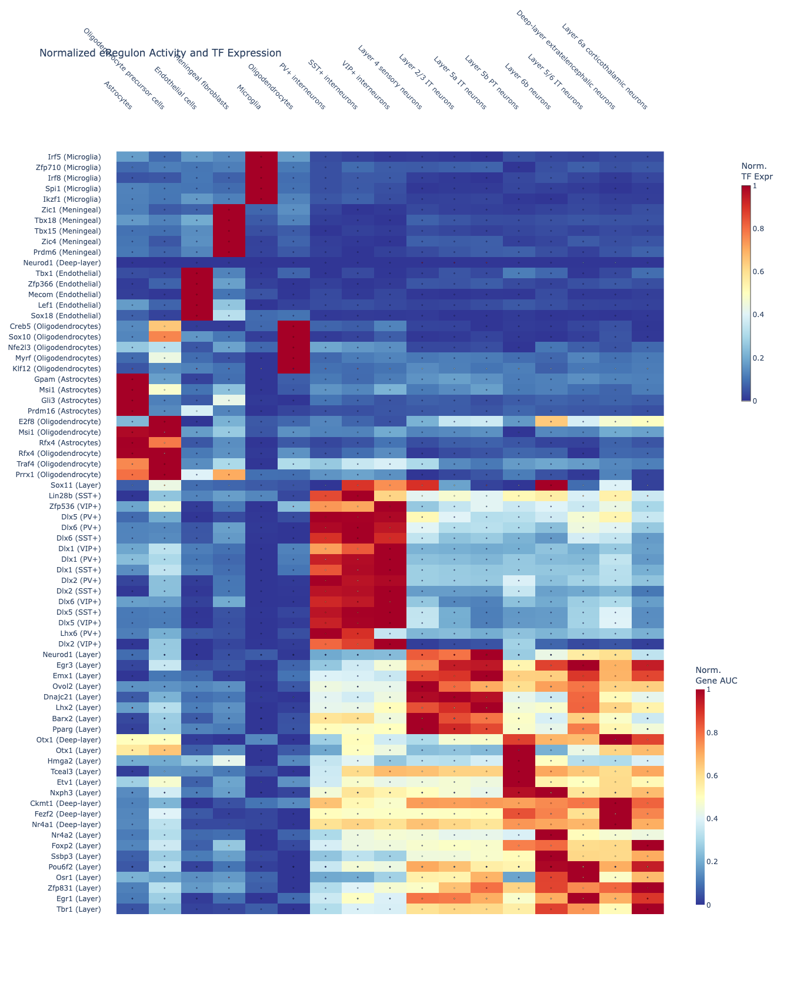

In [103]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list

# ── 1. Pull Raw Matrices & Metadata ──────────────────────────────────────────
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "rb") as f:
    ckpt = pickle.load(f)
tf_assign = ckpt["tf_assignment"]

auc_gene_raw = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg_raw  = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw     = scplus_obj.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()

meta = scplus_obj.metadata_cell[["cell_type"]].copy()
meta["cell_type"] = meta["cell_type"].astype(str)

# ── 2. Safe Groupby ──────────────────────────────────────────────────────────
def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_cell_type_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_cell_type_").mean().T

gene_mean = safe_mean_groupby(auc_gene_raw, meta)
reg_mean  = safe_mean_groupby(auc_reg_raw, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

if reg_mean.empty:
    reg_mean = gene_mean.copy()
    reg_mean.loc[:, :] = 0.5

# ── 3. Find Intersecting TFs (NO TRUNCATION) ────────────────────────────────
valid_cells = sorted(list(set(gene_mean.columns) & set(reg_mean.columns) & set(expr_mean.columns)))

final_sigs, final_tfs = [], []
for sig, tf_val in tf_assign.items():
    tf = tf_val.split()[0].capitalize()
    if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
        final_sigs.append(sig)
        final_tfs.append(tf)

# Removed the [:60] cutoff! All TFs will now be plotted.

# ── 4. Subset and Absolute Normalize (Forces max size variance) ─────────────
g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

def absolute_min_max(matrix):
    if matrix.size == 0: return matrix
    # Absolute min/max ensures the highest value gets the absolute max size
    mins = np.nanmin(matrix, axis=1, keepdims=True)
    maxs = np.nanmax(matrix, axis=1, keepdims=True)
    
    ranges = maxs - mins
    ranges[ranges == 0] = 1e-9 # Prevent division by zero if row is flat
    
    normed = (matrix - mins) / ranges
    return np.nan_to_num(normed, nan=0.0)

g_norm = absolute_min_max(g_sub)
r_norm = absolute_min_max(r_sub)
e_norm = absolute_min_max(e_sub)

# ── 5. Hierarchical Clustering ──────────────────────────────────────────────
if len(final_sigs) > 2:
    Z_rows = linkage(g_norm, method='ward', metric='euclidean')
    row_order = leaves_list(Z_rows)
    
    final_sigs = [final_sigs[i] for i in row_order]
    final_tfs = [final_tfs[i] for i in row_order]
    g_norm = g_norm[row_order, :]
    r_norm = r_norm[row_order, :]
    e_norm = e_norm[row_order, :]

if len(valid_cells) > 2:
    Z_cols = linkage(g_norm.T, method='ward', metric='euclidean')
    col_order = leaves_list(Z_cols)
    
    valid_cells = [valid_cells[i] for i in col_order]
    g_norm = g_norm[:, col_order]
    r_norm = r_norm[:, col_order]
    e_norm = e_norm[:, col_order]

# ── 6. Build Coordinates ────────────────────────────────────────────────────
x_scatter, y_scatter = [], []
c_expr, s_reg, c_gene = [], [], [] 

# Clean display names to show TF and its assigned target cell type from dictionary
y_unique = [f"{tf} ({tf_assign[sig].split()[1] if len(tf_assign[sig].split()) > 1 else sig[:5]})" 
            for tf, sig in zip(final_tfs, final_sigs)]

for i in range(len(final_tfs)):
    for j in range(len(valid_cells)):
        x_scatter.append(valid_cells[j])
        y_scatter.append(y_unique[i])
        c_expr.append(e_norm[i, j])
        # Force extreme size differences (Base: 2, Max: 35)
        s_reg.append((r_norm[i, j] * 33) + 2) 
        c_gene.append(g_norm[i, j])

# ── 7. Plot ─────────────────────────────────────────────────────────────────
fig = go.Figure()

# Background Heatmap
fig.add_trace(go.Heatmap(
    x=valid_cells,
    y=y_unique,
    z=g_norm,
    colorscale="RdYlBu_r",
    showscale=True,
    colorbar=dict(title="Norm.<br>Gene AUC", x=1.02, y=0.2, len=0.3, thickness=15)
))

# Foreground Scatter (Dots)
fig.add_trace(go.Scatter(
    x=x_scatter,
    y=y_scatter, 
    mode="markers",
    marker=dict(
        size=s_reg,
        color=c_expr,
        colorscale="RdYlBu_r",
        showscale=True,
        colorbar=dict(title="Norm.<br>TF Expr", x=1.1, y=0.8, len=0.3, thickness=15),
        line=dict(color="black", width=0.5) 
    ),
    hovertext=[f"TF: {y}<br>Cell: {x}<br>Expr: {e:.2f}<br>Reg AUC: {(s-2)/33:.2f}<br>Gene AUC: {g:.2f}" 
               for x, y, e, s, g in zip(x_scatter, y_scatter, c_expr, s_reg, c_gene)],
    hoverinfo="text"
))

fig.update_layout(
    title="Normalized eRegulon Activity and TF Expression",
    xaxis=dict(tickangle=45, side="top", showgrid=False),
    yaxis=dict(showgrid=False, autorange="reversed"),
    height=max(800, len(final_sigs) * 20), # Increased height dynamically so everything fits
    width=max(1000, len(valid_cells) * 45),
    plot_bgcolor="white",
    margin=dict(r=150)
)

fig.show()

# Optimized for Mac Silicon (M4 Max) - uses kaleido engine
# fig.write_image("ereg_activity_full.pdf", engine="kaleido")

In [110]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list

print("─── 1. LOADING DATA ───")
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final.pkl", "rb") as f:
    scplus_obj_geno = pickle.load(f)

with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "rb") as f:
    ckpt = pickle.load(f)
tf_assign = ckpt["tf_assignment"]

auc_gene_raw = scplus_obj_geno.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg_raw  = scplus_obj_geno.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw     = scplus_obj_geno.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()

meta = scplus_obj_geno.metadata_cell[["cell_type"]].copy()
meta["cell_type"] = meta["cell_type"].astype(str)
valid_cts = meta["cell_type"].unique().tolist()

print(f"Gene AUC shape: {auc_gene_raw.shape}")
print(f"Reg AUC shape:  {auc_reg_raw.shape}")
print(f"Expr shape:     {expr_raw.shape}")
print(f"Meta shape:     {meta.shape}")
print(f"Gene AUC index (sample): {list(auc_gene_raw.index[:2])}")
print(f"Reg AUC index (sample):  {list(auc_reg_raw.index[:2])}")

print("\n─── 2. GROUPING BY CELL TYPE ───")
# Gene AUC
common_gene = list(set(auc_gene_raw.index) & set(meta.index))
print(f"Gene AUC: Found {len(common_gene)} overlapping barcodes with metadata.")
g_sub = auc_gene_raw.loc[common_gene].copy()
g_sub["_ct_"] = meta.loc[common_gene, "cell_type"]
gene_mean = g_sub.groupby("_ct_").mean().T

# Expression
common_expr = list(set(expr_raw.index) & set(meta.index))
print(f"Expression: Found {len(common_expr)} overlapping barcodes with metadata.")
e_sub = expr_raw.loc[common_expr].copy()
e_sub["_ct_"] = meta.loc[common_expr, "cell_type"]
expr_mean = e_sub.groupby("_ct_").mean().T

# Region AUC (Handling direct vs metacell)
common_reg = list(set(auc_reg_raw.index) & set(meta.index))
if len(common_reg) > 0:
    print(f"Reg AUC: Found {len(common_reg)} DIRECT barcode matches with metadata.")
    r_sub = auc_reg_raw.loc[common_reg].copy()
    r_sub["_ct_"] = meta.loc[common_reg, "cell_type"]
    reg_mean = r_sub.groupby("_ct_").mean().T
else:
    print("Reg AUC: No direct matches. Attempting Metacell string matching...")
    keep_idx, mapped_cts = [], []
    for idx in auc_reg_raw.index:
        for ct in valid_cts:
            # Strip spaces for robust matching (e.g. "Layer2/3" vs "Layer 2/3")
            if ct.replace(" ", "") in str(idx).replace(" ", "") or ct in str(idx):
                keep_idx.append(idx)
                mapped_cts.append(ct)
                break
    
    print(f"Reg AUC: Mapped {len(keep_idx)} rows to cell types via string search.")
    if len(keep_idx) > 0:
        r_sub = auc_reg_raw.loc[keep_idx].copy()
        r_sub["_ct_"] = mapped_cts
        reg_mean = r_sub.groupby("_ct_").mean().T
    else:
        reg_mean = pd.DataFrame()

print(f"Gene Mean shape: {gene_mean.shape}")
print(f"Reg Mean shape:  {reg_mean.shape}")
print(f"Expr Mean shape: {expr_mean.shape}")

print("\n─── 3. INTERSECTING MATRICES ───")
valid_cells = sorted(list(set(gene_mean.columns) & set(reg_mean.columns) & set(expr_mean.columns)))
print(f"Valid intersecting Cell Types ({len(valid_cells)}): {valid_cells}")

if len(valid_cells) == 0:
    raise ValueError("HALTING: 0 cell types intersect across Gene, Region, and Expr matrices. Check the diagnostic prints above.")

final_sigs, final_tfs = [], []
for sig, tf_val in tf_assign.items():
    tf = tf_val.split()[0].capitalize()
    
    # Clean signature names for Region AUC lookup (e.g., handles "pos_manual_")
    reg_sig = None
    if sig in reg_mean.index:
        reg_sig = sig
    else:
        for r_idx in reg_mean.index:
            if sig in r_idx or r_idx in sig:
                reg_sig = r_idx
                break
                
    if sig in gene_mean.index and reg_sig and tf in expr_mean.index:
        final_sigs.append((sig, reg_sig)) 
        final_tfs.append(tf)

print(f"Valid intersecting TFs/Signatures: {len(final_tfs)}")

if len(final_tfs) == 0:
    raise ValueError("HALTING: 0 TFs matched across matrices. Check if Region AUC column names match TF assignment dictionary.")

print("\n─── 4. NORMALIZING & PLOTTING ───")
g_sub = gene_mean.loc[[s[0] for s in final_sigs], valid_cells].values.astype(float)
r_sub = reg_mean.loc[[s[1] for s in final_sigs], valid_cells].values.astype(float)
e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

def absolute_min_max(matrix):
    if matrix.size == 0: return matrix
    mins = np.nanmin(matrix, axis=1, keepdims=True)
    maxs = np.nanmax(matrix, axis=1, keepdims=True)
    ranges = maxs - mins
    ranges[ranges == 0] = 1e-9 
    normed = (matrix - mins) / ranges
    return np.nan_to_num(normed, nan=0.0)

g_norm = absolute_min_max(g_sub)
r_norm = absolute_min_max(r_sub)
e_norm = absolute_min_max(e_sub)

# Hierarchical Clustering
if len(final_sigs) > 2:
    Z_rows = linkage(g_norm, method='ward', metric='euclidean')
    row_order = leaves_list(Z_rows)
    final_sigs = [final_sigs[i] for i in row_order]
    final_tfs = [final_tfs[i] for i in row_order]
    g_norm = g_norm[row_order, :]
    r_norm = r_norm[row_order, :]
    e_norm = e_norm[row_order, :]

if len(valid_cells) > 2:
    Z_cols = linkage(g_norm.T, method='ward', metric='euclidean')
    col_order = leaves_list(Z_cols)
    valid_cells = [valid_cells[i] for i in col_order]
    g_norm = g_norm[:, col_order]
    r_norm = r_norm[:, col_order]
    e_norm = e_norm[:, col_order]

# Build Coordinates
x_scatter, y_scatter = [], []
c_expr, s_reg, c_gene = [], [], [] 

y_unique = [f"{tf} ({tf_assign[s[0]].split()[1] if len(tf_assign[s[0]].split()) > 1 else s[0][:5]})" 
            for tf, s in zip(final_tfs, final_sigs)]

for i in range(len(final_tfs)):
    for j in range(len(valid_cells)):
        x_scatter.append(valid_cells[j])
        y_scatter.append(y_unique[i])
        c_expr.append(e_norm[i, j])
        s_reg.append((r_norm[i, j] * 42) + 3) # Real Reg AUC Size
        c_gene.append(g_norm[i, j])

fig = go.Figure()

# Background Heatmap
fig.add_trace(go.Heatmap(
    x=valid_cells,
    y=y_unique,
    z=g_norm,
    colorscale="RdYlBu_r",
    showscale=True,
    colorbar=dict(title="Norm.<br>Gene AUC", x=1.02, y=0.2, len=0.3, thickness=15)
))

# Dots
fig.add_trace(go.Scatter(
    x=x_scatter,
    y=y_scatter, 
    mode="markers",
    marker=dict(
        size=s_reg,
        color=c_expr,
        colorscale="RdYlBu_r",
        showscale=True,
        colorbar=dict(title="Norm.<br>TF Expr", x=1.1, y=0.8, len=0.3, thickness=15),
        line=dict(color="black", width=0.5) 
    ),
    hovertext=[f"TF: {y}<br>Cell: {x}<br>TF Expr: {e:.2f}<br>Reg AUC: {(s-3)/42:.2f}<br>Gene AUC: {g:.2f}" 
               for x, y, e, s, g in zip(x_scatter, y_scatter, c_expr, s_reg, c_gene)],
    hoverinfo="text"
))

fig.update_layout(
    title="Normalized eRegulon Activity and TF Expression",
    xaxis=dict(tickangle=45, side="top", showgrid=False),
    yaxis=dict(showgrid=False, autorange="reversed"),
    height=max(800, len(final_sigs) * 20),
    width=max(1000, len(valid_cells) * 45),
    plot_bgcolor="white",
    margin=dict(r=150)
)

fig.show()
fig.write_image("ereg_activity_diagnosed.pdf", engine="kaleido")
print("─── PLOT GENERATED SUCCESSFULLY ───")

### FOUND AN ERROR, FIXING IN THE NEXT CELL

─── 1. LOADING DATA ───
Gene AUC shape: (2446, 85)
Reg AUC shape:  (746029, 85)
Expr shape:     (2446, 56884)
Meta shape:     (2446, 1)
Gene AUC index (sample): ['Astrocytes_Ctrl_0', 'Astrocytes_Ctrl_1']
Reg AUC index (sample):  ['chr1:3050972-3051472', 'chr1:3053155-3053655']

─── 2. GROUPING BY CELL TYPE ───
Gene AUC: Found 2446 overlapping barcodes with metadata.
Expression: Found 2446 overlapping barcodes with metadata.
Reg AUC: No direct matches. Attempting Metacell string matching...
Reg AUC: Mapped 0 rows to cell types via string search.
Gene Mean shape: (85, 17)
Reg Mean shape:  (0, 0)
Expr Mean shape: (56884, 17)

─── 3. INTERSECTING MATRICES ───
Valid intersecting Cell Types (0): []


ValueError: HALTING: 0 cell types intersect across Gene, Region, and Expr matrices. Check the diagnostic prints above.

In [1]:
import pandas as pd
import pickle

# --- 1. Imports ---
try:
    from scenicplus.eRegulon_enrichment import score_eRegulons
except ModuleNotFoundError:
    from scenicplus.eregulon_enrichment import score_eRegulons

# --- 2. Load the Object and Checkpoint ---
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final.pkl", "rb") as f:
    scplus_obj = pickle.load(f)
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "rb") as f:
    ckpt = pickle.load(f)

df_multi = ckpt["df_multi"]
tf_assign = ckpt["tf_assignment"]

# --- 3. Extract True Genomic Regions from Region_to_gene table ---
print("Extracting genomic regions from Region_to_gene table...")
r2g = scplus_obj.uns["Region_to_gene"].copy()

# Standardize column names dynamically
col_map = {}
for c in r2g.columns:
    if c.lower() in ['target', 'gene']: col_map[c] = 'Target'
    elif c.lower() in ['region']: col_map[c] = 'Region'
    elif c.lower() in ['rho', 'correlation']: col_map[c] = 'rho'
r2g = r2g.rename(columns=col_map)

# Filter for positive correlations if rho is present (enhancers generally open -> gene expression goes up)
if 'rho' in r2g.columns:
    r2g = r2g[r2g['rho'] > 0]

# Build a dictionary mapping each gene to its associated enhancer regions
gene_to_regions = r2g.groupby('Target')['Region'].apply(set).to_dict()

# --- 4. Repair the df_multi Signatures ---
print("Repairing df_multi region signatures...")
new_rows = []
for _, row in df_multi.iterrows():
    sig = row["Gene_signature_name"]
    g = row["Gene"]
    
    if pd.isna(g): continue
        
    # 1. Add Gene record
    new_rows.append({"Gene_signature_name": sig, "Gene": g})
    
    # 2. Add corresponding Region records
    regions = gene_to_regions.get(g, set())
    for r in regions:
        new_rows.append({"Region_signature_name": sig, "Region": r})

df_multi_fixed = pd.DataFrame(new_rows).dropna(how='all')
print(f"Old df_multi rows: {len(df_multi)}. Repaired rows: {len(df_multi_fixed)}")

# --- 5. Transpose ACC and Rescore ---
print("Transposing ACC matrix so cells are rows...")
acc_mtx_transposed = scplus_obj.to_df('ACC').T

print("Scoring repaired signatures with correctly oriented matrix...")
auc_result_corrected = score_eRegulons(
    eRegulons = df_multi_fixed, 
    gex_mtx = scplus_obj.to_df('EXP'), 
    acc_mtx = acc_mtx_transposed, 
    auc_threshold = 0.05,
    normalize = False,
    n_cpu = 4
)

# --- 6. Safely Update and Save ---
print("Patching object...")
if "eRegulon_AUC_multi_spec" not in scplus_obj.uns:
    scplus_obj.uns["eRegulon_AUC_multi_spec"] = {}

# Only overwrite the Region AUC
scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"] = auc_result_corrected["Region_based"]
ckpt["df_multi_fixed"] = df_multi_fixed # Save the fixed signature table

print("Saving repaired object...")
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "wb") as f:
    pickle.dump(scplus_obj, f)
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final_REPAIRED.pkl", "wb") as f:
    pickle.dump(ckpt, f)

print("Success! Region AUC is now genuinely calculated based on genomic coordinates.")

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Extracting genomic regions from Region_to_gene table...
Repairing df_multi region signatures...
Old df_multi rows: 8450. Repaired rows: 841478
Transposing ACC matrix so cells are rows...
Scoring repaired signatures with correctly oriented matrix...


Less than 80% of the genes in Deep-layer extratelencephalic neurons_pos_manual_Neurod1 are present in the expression matrix.


Patching object...
Saving repaired object...
Success! Region AUC is now genuinely calculated based on genomic coordinates.


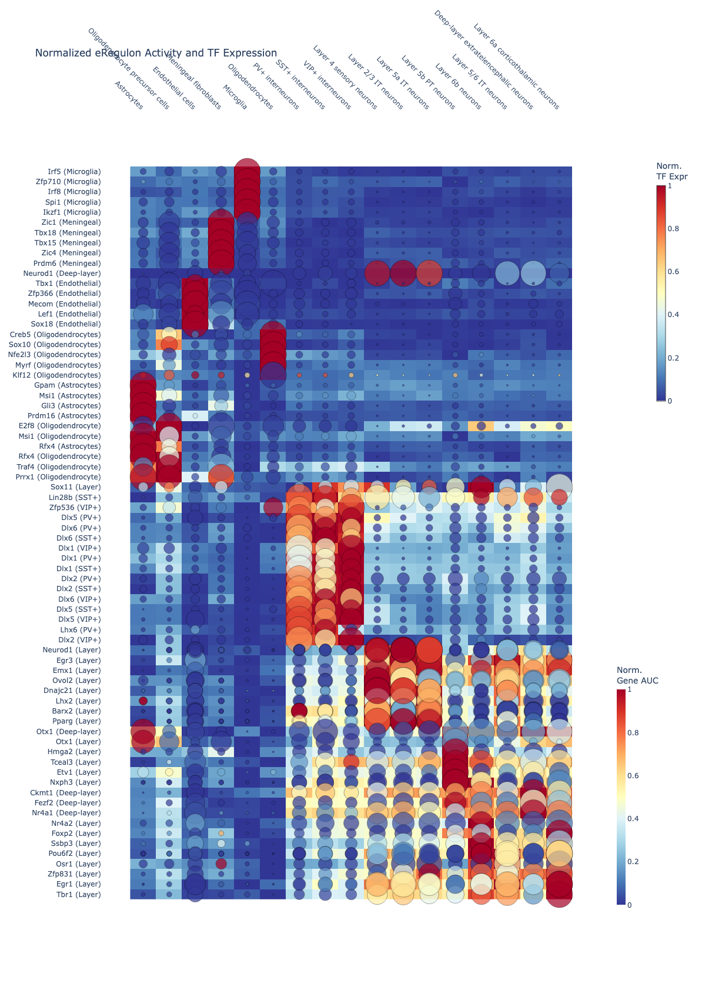

In [2]:
###### PLOTLY v0

import plotly.graph_objects as go
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list

# ── 1. Pull Repaired Object & Checkpoint ────────────────────────────────────
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "rb") as f:
    scplus_obj_geno = pickle.load(f)

with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final.pkl", "rb") as f:
    ckpt = pickle.load(f)
tf_assign = ckpt["tf_assignment"]

# Extract ALL three correctly shaped cell-level matrices
auc_gene_raw = scplus_obj_geno.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg_raw  = scplus_obj_geno.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw     = scplus_obj_geno.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()

meta = scplus_obj_geno.metadata_cell[["cell_type"]].copy()
meta["cell_type"] = meta["cell_type"].astype(str)

# ── 2. Safe Groupby (All matrices are now Cells x Features) ────────────────
def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_cell_type_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_cell_type_").mean().T

# All three map perfectly because they now share the exact same cell barcodes
gene_mean = safe_mean_groupby(auc_gene_raw, meta)
reg_mean  = safe_mean_groupby(auc_reg_raw, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

# ── 3. Find Intersecting TFs ───────────────────────────────────────────────
valid_cells = sorted(list(set(gene_mean.columns) & set(reg_mean.columns) & set(expr_mean.columns)))

final_sigs, final_tfs = [], []
for sig, tf_val in tf_assign.items():
    tf = tf_val.split()[0].capitalize()
    # Clean signature check - now standard and exact across Gene and Region matrices
    if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
        final_sigs.append(sig) 
        final_tfs.append(tf)

# ── 4. Subset and Normalize (Absolute Min-Max for true variance) ────────────
g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

def absolute_min_max(matrix):
    if matrix.size == 0: return matrix
    mins = np.nanmin(matrix, axis=1, keepdims=True)
    maxs = np.nanmax(matrix, axis=1, keepdims=True)
    ranges = maxs - mins
    ranges[ranges == 0] = 1e-9 
    normed = (matrix - mins) / ranges
    return np.nan_to_num(normed, nan=0.0)

g_norm = absolute_min_max(g_sub)
r_norm = absolute_min_max(r_sub)
e_norm = absolute_min_max(e_sub)

# ── 5. Hierarchical Clustering ──────────────────────────────────────────────
if len(final_sigs) > 2:
    Z_rows = linkage(g_norm, method='ward', metric='euclidean')
    row_order = leaves_list(Z_rows)
    
    final_sigs = [final_sigs[i] for i in row_order]
    final_tfs = [final_tfs[i] for i in row_order]
    g_norm = g_norm[row_order, :]
    r_norm = r_norm[row_order, :]
    e_norm = e_norm[row_order, :]

if len(valid_cells) > 2:
    Z_cols = linkage(g_norm.T, method='ward', metric='euclidean')
    col_order = leaves_list(Z_cols)
    
    valid_cells = [valid_cells[i] for i in col_order]
    g_norm = g_norm[:, col_order]
    r_norm = r_norm[:, col_order]
    e_norm = e_norm[:, col_order]

# ── 6. Build Coordinates ────────────────────────────────────────────────────
x_scatter, y_scatter = [], []
c_expr, s_reg, c_gene = [], [], [] 

y_unique = [f"{tf} ({tf_assign[sig].split()[1] if len(tf_assign[sig].split()) > 1 else sig[:5]})" 
            for tf, sig in zip(final_tfs, final_sigs)]

for i in range(len(final_tfs)):
    for j in range(len(valid_cells)):
        x_scatter.append(valid_cells[j])
        y_scatter.append(y_unique[i])
        c_expr.append(e_norm[i, j])
        
        # True Region AUC for dot size! (Scaled for visibility: Base 3, Max 45)
        s_reg.append((r_norm[i, j] * 42) + 3) 
        c_gene.append(g_norm[i, j])

# ── 7. Plot ─────────────────────────────────────────────────────────────────
fig = go.Figure()

# Background Heatmap (Gene AUC)
fig.add_trace(go.Heatmap(
    x=valid_cells,
    y=y_unique,
    z=g_norm,
    colorscale="RdYlBu_r",
    showscale=True,
    colorbar=dict(title="Norm.<br>Gene AUC", x=1.02, y=0.2, len=0.3, thickness=15)
))

# Foreground Scatter (Dots - TF Expr Color, REAL Region AUC Size)
fig.add_trace(go.Scatter(
    x=x_scatter,
    y=y_scatter, 
    mode="markers",
    marker=dict(
        size=s_reg,
        color=c_expr,
        colorscale="RdYlBu_r",
        showscale=True,
        colorbar=dict(title="Norm.<br>TF Expr", x=1.1, y=0.8, len=0.3, thickness=15),
        line=dict(color="black", width=0.5) 
    ),
    hovertext=[f"TF: {y}<br>Cell: {x}<br>TF Expr: {e:.2f}<br>Reg AUC: {(s-3)/42:.2f}<br>Gene AUC: {g:.2f}" 
               for x, y, e, s, g in zip(x_scatter, y_scatter, c_expr, s_reg, c_gene)],
    hoverinfo="text"
))

fig.update_layout(
    title="Normalized eRegulon Activity and TF Expression",
    xaxis=dict(tickangle=45, side="top", showgrid=False),
    yaxis=dict(showgrid=False, autorange="reversed"),
    height=max(800, len(final_sigs) * 20),
    width=max(1000, len(valid_cells) * 45),
    plot_bgcolor="white",
    margin=dict(r=150)
)

fig.show()
fig.write_image("ereg_activity_fully_repaired.pdf")

Generating 'All Cells' version...


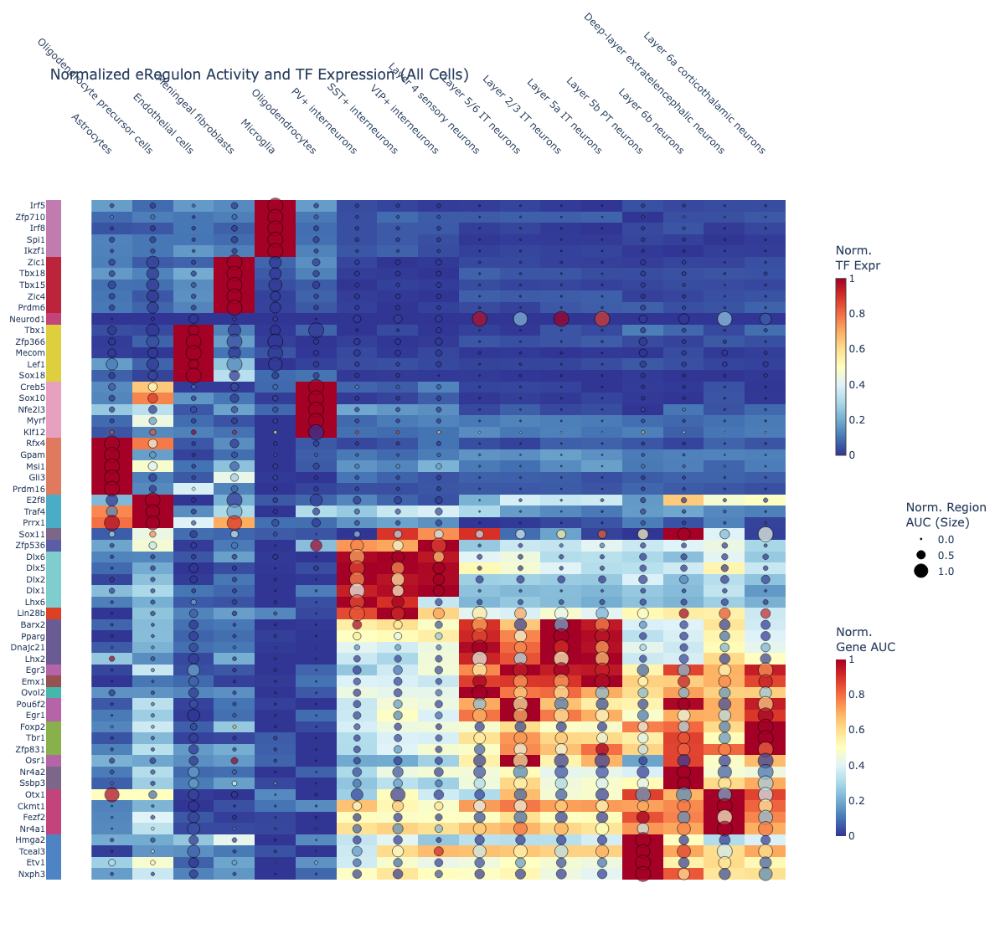

Generating 'Glia and Neurons Only' version...


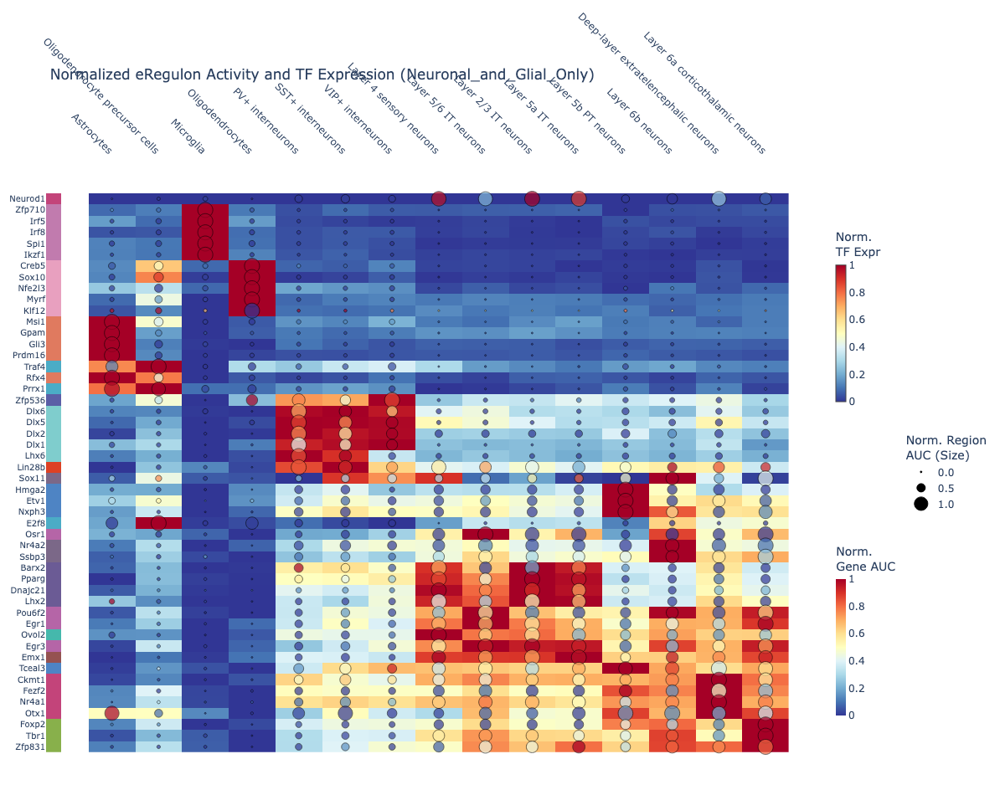

In [4]:
###### PLOTLY v1

import plotly.graph_objects as go
import plotly.subplots as sp
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list

# ── 1. Color Map ──────────────────────────────────────────────────────────
atac_new_order = [
    'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5a IT neurons', 
    'Layer 5b PT neurons', 'Layer 5/6 IT neurons', 'Layer 6a corticothalamic neurons', 
    'Layer 6b neurons', 'Deep-layer extratelencephalic neurons', 'Corticospinal neurons Type I',
    'Corticospinal neurons Type II', 'PV+ interneurons', 'SST+ interneurons', 
    'VIP+ interneurons', 'Astrocytes', 'Oligodendrocyte precursor cells', 
    'Oligodendrocytes', 'Perineuronal oligodendrocytes', 'Myelinating oligodendrocytes', 
    'Microglia', 'Endothelial cells', 'Leptomeningeal cells', 'Meningeal fibroblasts'
]
hex_colors = [
    '#6B5B95', '#45B8AC', '#955251', '#4E84C4', '#B565A7', '#88B04B', '#7B6888', '#C3447A',
    '#009B77', '#EFC050', '#7FCDCD', '#DD4124', '#5B5EA6', '#E07A5F', '#4BACC6', '#E8A0BF',
    '#ea8a33', '#9B2335', '#C17BAE', '#DECF3F', '#789262', '#BC243C'
]
ataccolors = dict(zip(atac_new_order, hex_colors))

# ── 2. Data Loading ────────────────────────────────────────────────────────
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     scplus_obj = pickle.load(f)
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     ckpt = pickle.load(f)
    
tf_assign = ckpt["tf_assignment"]
auc_gene = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg  = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw = scplus_obj.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()
meta = scplus_obj.metadata_cell[["cell_type"]].copy()

def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_ct_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_ct_").mean().T

gene_mean = safe_mean_groupby(auc_gene, meta)
reg_mean  = safe_mean_groupby(auc_reg, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

# ── 3. Plotting Function ───────────────────────────────────────────────────
def generate_plot(exclude_celltypes, filename_suffix):
    # Filter valid cells
    valid_cells = sorted([c for c in gene_mean.columns if c in reg_mean.columns and c in expr_mean.columns and c not in exclude_celltypes])
    
    # 1. Map Signatures to TFs and ensure 1:1 uniqueness
    final_sigs, final_tfs, final_ct_colors = [], [], []
    seen_tfs = set() # PREVENT DUPLICATES
    
    for sig, tf_val in tf_assign.items():
        tf = tf_val.split()[0].capitalize()
        if tf in seen_tfs: continue
        
        # Resolve source cell type color
        ct_source = sig.replace("pos_manual_", "").replace("_", " ")
        matched_ct = next((k for k in atac_new_order if k.replace(" ", "") in ct_source.replace(" ", "")), ct_source)
                
        if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
            if matched_ct in exclude_celltypes: continue
                
            final_sigs.append(sig)
            final_tfs.append(tf)
            final_ct_colors.append(ataccolors.get(matched_ct, "#999999"))
            seen_tfs.add(tf)

    # 2. Extract Data
    g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
    r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
    e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

    # 3. Min-Max Normalization per row [0, 1]
    def abs_norm(m):
        m = np.nan_to_num(m, nan=0.0)
        mins = np.nanmin(m, axis=1, keepdims=True)
        maxs = np.nanmax(m, axis=1, keepdims=True)
        rng = maxs - mins
        rng[rng == 0] = 1e-9 
        return (m - mins) / rng

    g_n, r_n, e_n = abs_norm(g_sub), abs_norm(r_sub), abs_norm(e_sub)

    # 4. Hierarchical Clustering
    if len(final_sigs) > 2:
        Z_rows = linkage(g_n, method='ward')
        r_ord = leaves_list(Z_rows)
        final_sigs = [final_sigs[i] for i in r_ord]
        final_tfs = [final_tfs[i] for i in r_ord]
        final_ct_colors = [final_ct_colors[i] for i in r_ord]
        g_n, r_n, e_n = g_n[r_ord, :], r_n[r_ord, :], e_n[r_ord, :]

    if len(valid_cells) > 2:
        Z_cols = linkage(g_n.T, method='ward')
        c_ord = leaves_list(Z_cols)
        valid_cells = [valid_cells[i] for i in c_ord]
        g_n, r_n, e_n = g_n[:, c_ord], r_n[:, c_ord], e_n[:, c_ord]

    # 5. Construct Coordinates
    x_s, y_s, c_e, s_r = [], [], [], []
    max_dot_size = 18 # Max size to fit inside heatmap cells
    min_dot_size = 2
    
    for i in range(len(final_tfs)):
        for j in range(len(valid_cells)):
            x_s.append(valid_cells[j])
            y_s.append(final_tfs[i])
            c_e.append(e_n[i, j])
            s_r.append(min_dot_size + (r_n[i, j] * (max_dot_size - min_dot_size)))

    # ── Plotly Construction ────────────────────────────────────────────────
    fig = sp.make_subplots(
        rows=1, cols=2, 
        column_widths=[0.02, 0.98],
        horizontal_spacing=0.005,
        shared_yaxes=True
    )

    # A. Left Color Bar (TF Origin)
    color_bar_z = [[i] for i in range(len(final_tfs))]
    color_scale_discrete = [[i/(max(1, len(final_tfs)-1)), c] for i, c in enumerate(final_ct_colors)]
    
    fig.add_trace(go.Heatmap(
        z=color_bar_z,
        x=[""], y=final_tfs,
        colorscale=color_scale_discrete,
        showscale=False,
        hoverinfo="skip"
    ), row=1, col=1)

    # B. Background Heatmap (Gene AUC)
    fig.add_trace(go.Heatmap(
        z=g_n,
        x=valid_cells, y=final_tfs,
        colorscale="RdYlBu_r",
        colorbar=dict(title="Norm.<br>Gene AUC", x=1.02, y=0.25, len=0.3, thickness=12),
        hovertext=[[f"Cell: {x}<br>TF: {y}<br>Gene AUC: {z:.2f}" for x, z in zip(valid_cells, row)] for y, row in zip(final_tfs, g_n)],
        hoverinfo="text"
    ), row=1, col=2)

    # C. Overlay Scatter (TF Expression & Region AUC)
    fig.add_trace(go.Scatter(
        x=x_s, y=y_s, 
        mode="markers",
        marker=dict(
            size=s_r,
            color=c_e,
            colorscale="RdYlBu_r",
            colorbar=dict(title="Norm.<br>TF Expr", x=1.02, y=0.75, len=0.3, thickness=12),
            line=dict(color="black", width=0.8) 
        ),
        hovertext=[f"Cell: {x}<br>TF: {y}<br>Expr: {e:.2f}<br>Reg AUC: {(s-min_dot_size)/(max_dot_size-min_dot_size):.2f}" 
                   for x, y, e, s in zip(x_s, y_s, c_e, s_r)],
        hoverinfo="text",
        showlegend=False
    ), row=1, col=2)

    # D. Fake traces for Size Legend (Region AUC)
    legend_sizes = [0.0, 0.5, 1.0]
    for val in legend_sizes:
        size_px = min_dot_size + (val * (max_dot_size - min_dot_size))
        fig.add_trace(go.Scatter(
            x=[None], y=[None], mode="markers",
            marker=dict(size=size_px, color="black", line=dict(color="black", width=1)),
            name=f"{val}",
            legendgroup="size",
            showlegend=True
        ), row=1, col=2)

    # Layout tuning
    fig.update_layout(
        title=f"Normalized eRegulon Activity and TF Expression ({filename_suffix})",
        height=max(600, len(final_tfs) * 16 + 150),
        width=max(800, len(valid_cells) * 35 + 200),
        plot_bgcolor="white",
        margin=dict(l=10, r=120, t=100, b=10),
        legend=dict(
            title="Norm. Region<br>AUC (Size)",
            x=1.12, y=0.5, xanchor="left", yanchor="middle",
            bgcolor="rgba(255,255,255,0.8)"
        )
    )
    
    fig.update_xaxes(showticklabels=False, row=1, col=1)
    fig.update_xaxes(tickangle=45, side="top", showgrid=False, row=1, col=2)
    fig.update_yaxes(autorange="reversed", showgrid=False, tickfont=dict(size=10))

    fig.show()
    fig.write_image(f"ereg_activity_{filename_suffix.replace(' ', '_')}.pdf")

# ── 5. Execute ─────────────────────────────────────────────────────────────
print("Generating 'All Cells' version...")
generate_plot(exclude_celltypes=[], filename_suffix="All Cells")

print("Generating 'Glia and Neurons Only' version...")
generate_plot(
    exclude_celltypes=['Endothelial cells', 'Meningeal fibroblasts', 'Leptomeningeal cells'], 
    filename_suffix="Neuronal_and_Glial_Only"
)

Generating 'All Cells' version...


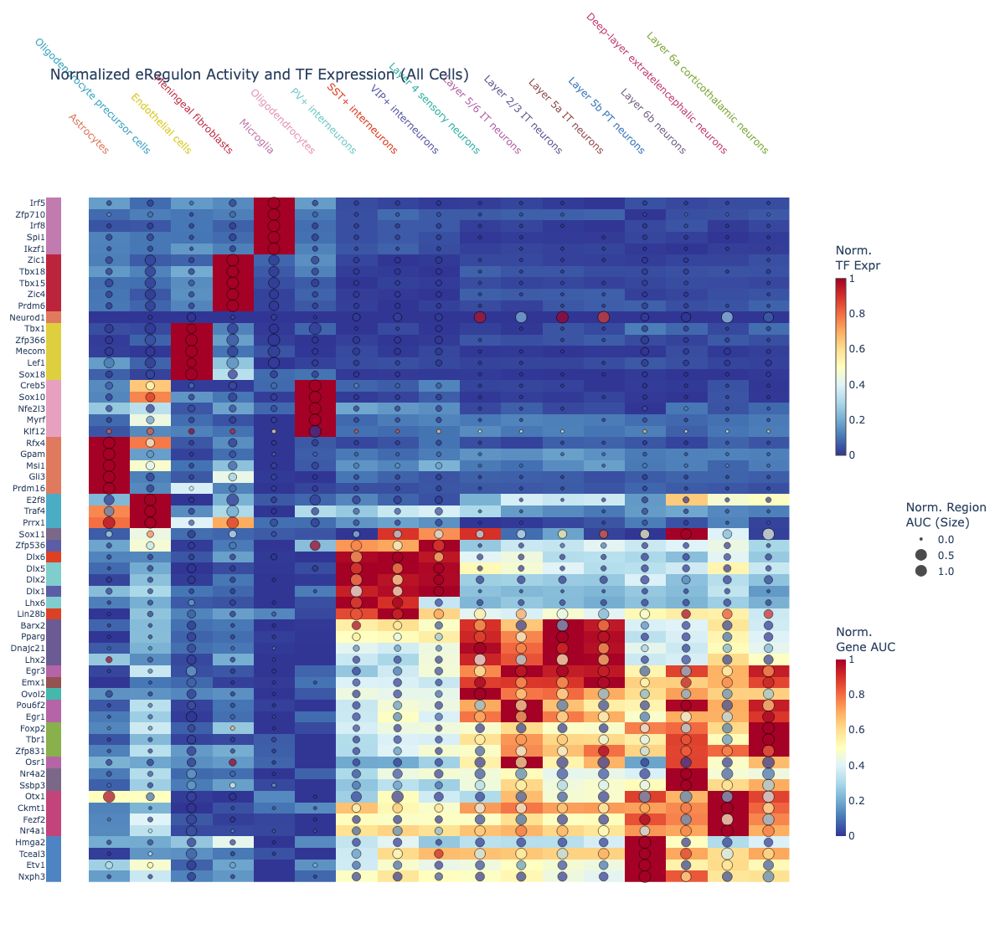

Generating 'Glia and Neurons Only' version...


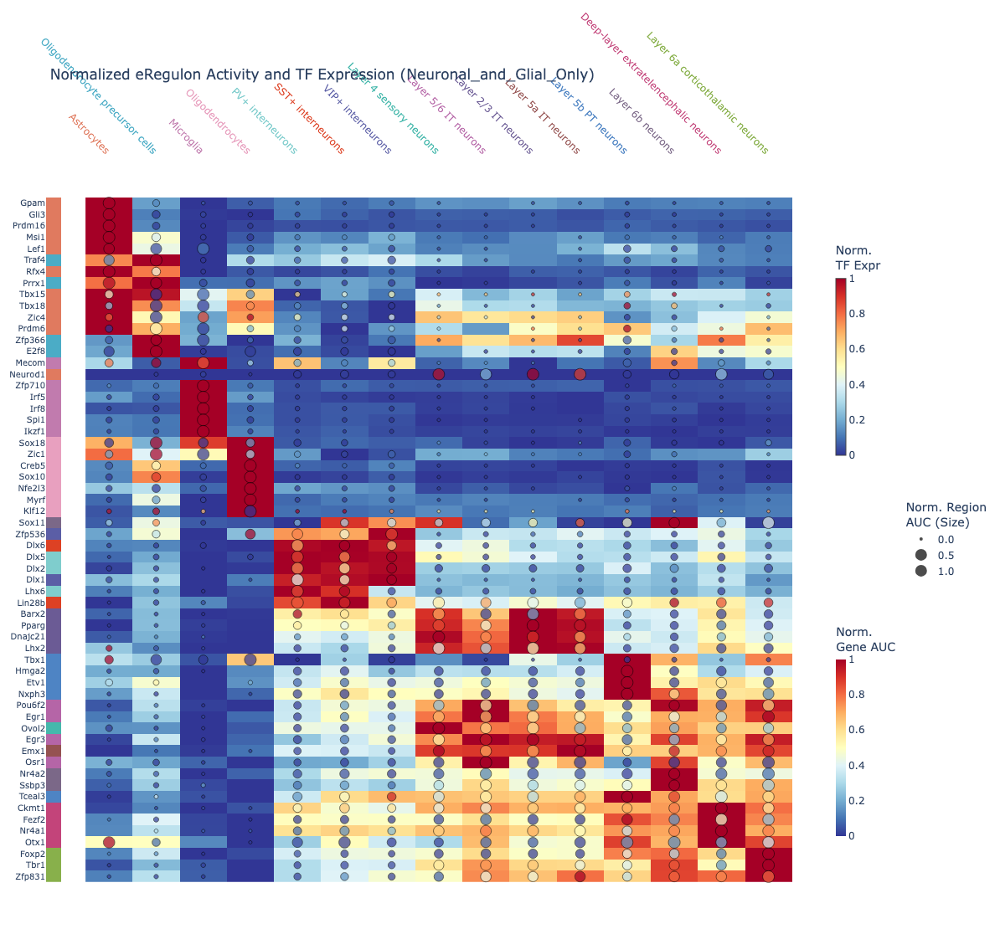

In [7]:
###### PLOTLY v2

import plotly.graph_objects as go
import plotly.subplots as sp
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list

# ── 1. Color Map ──────────────────────────────────────────────────────────
atac_new_order = [
    'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5a IT neurons', 
    'Layer 5b PT neurons', 'Layer 5/6 IT neurons', 'Layer 6a corticothalamic neurons', 
    'Layer 6b neurons', 'Deep-layer extratelencephalic neurons', 'Corticospinal neurons Type I',
    'Corticospinal neurons Type II', 'PV+ interneurons', 'SST+ interneurons', 
    'VIP+ interneurons', 'Astrocytes', 'Oligodendrocyte precursor cells', 
    'Oligodendrocytes', 'Perineuronal oligodendrocytes', 'Myelinating oligodendrocytes', 
    'Microglia', 'Endothelial cells', 'Leptomeningeal cells', 'Meningeal fibroblasts'
]
hex_colors = [
    '#6B5B95', '#45B8AC', '#955251', '#4E84C4', '#B565A7', '#88B04B', '#7B6888', '#C3447A',
    '#009B77', '#EFC050', '#7FCDCD', '#DD4124', '#5B5EA6', '#E07A5F', '#4BACC6', '#E8A0BF',
    '#ea8a33', '#9B2335', '#C17BAE', '#DECF3F', '#789262', '#BC243C'
]
ataccolors = dict(zip(atac_new_order, hex_colors))

# ── 2. Data Loading ────────────────────────────────────────────────────────
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     scplus_obj = pickle.load(f)
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     ckpt = pickle.load(f)
    
tf_assign = ckpt["tf_assignment"]
auc_gene = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg  = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw = scplus_obj.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()
meta = scplus_obj.metadata_cell[["cell_type"]].copy()

def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_ct_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_ct_").mean().T

gene_mean = safe_mean_groupby(auc_gene, meta)
reg_mean  = safe_mean_groupby(auc_reg, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

# ── 3. Plotting Function ───────────────────────────────────────────────────
def generate_plot(exclude_celltypes, filename_suffix):
    valid_cells = sorted([c for c in gene_mean.columns if c in reg_mean.columns and c in expr_mean.columns and c not in exclude_celltypes])
    
    final_sigs, final_tfs = [], []
    seen_tfs = set()
    
    # First Pass: gather signatures and TFs
    for sig, tf_val in tf_assign.items():
        tf = tf_val.split()[0].capitalize()
        if tf in seen_tfs: continue
        if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
            final_sigs.append(sig)
            final_tfs.append(tf)
            seen_tfs.add(tf)

    g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
    r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
    e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

    # Second Pass: Dynamically assign color based on max Gene AUC across all valid cells
    final_ct_colors = []
    for i in range(len(final_tfs)):
        max_ct_idx = np.argmax(g_sub[i, :])
        max_ct_name = valid_cells[max_ct_idx]
        final_ct_colors.append(ataccolors.get(max_ct_name, "#999999"))

    # 3. Min-Max Normalization per row [0, 1]
    def abs_norm(m):
        m = np.nan_to_num(m, nan=0.0)
        mins = np.nanmin(m, axis=1, keepdims=True)
        maxs = np.nanmax(m, axis=1, keepdims=True)
        rng = maxs - mins
        rng[rng == 0] = 1e-9 
        return (m - mins) / rng

    g_n, r_n, e_n = abs_norm(g_sub), abs_norm(r_sub), abs_norm(e_sub)

    # 4. Hierarchical Clustering
    if len(final_sigs) > 2:
        Z_rows = linkage(g_n, method='ward')
        r_ord = leaves_list(Z_rows)
        final_sigs = [final_sigs[i] for i in r_ord]
        final_tfs = [final_tfs[i] for i in r_ord]
        final_ct_colors = [final_ct_colors[i] for i in r_ord]
        g_n, r_n, e_n = g_n[r_ord, :], r_n[r_ord, :], e_n[r_ord, :]

    if len(valid_cells) > 2:
        Z_cols = linkage(g_n.T, method='ward')
        c_ord = leaves_list(Z_cols)
        valid_cells = [valid_cells[i] for i in c_ord]
        g_n, r_n, e_n = g_n[:, c_ord], r_n[:, c_ord], e_n[:, c_ord]

    # 5. Construct Coordinates
    x_s, y_s, c_e, s_r = [], [], [], []
    
    # We will use relative scale mapping instead of absolute pixels for PDF stability
    # The max value will represent the max area.
    for i in range(len(final_tfs)):
        for j in range(len(valid_cells)):
            x_s.append(valid_cells[j])
            y_s.append(final_tfs[i])
            c_e.append(e_n[i, j])
            s_r.append(r_n[i, j]) # Keep it exactly [0, 1]

    # ── Plotly Construction ────────────────────────────────────────────────
    fig = sp.make_subplots(
        rows=1, cols=2, 
        column_widths=[0.02, 0.98],
        horizontal_spacing=0.005,
        shared_yaxes=True
    )

    # A. Left Color Bar (Max Activity Origin)
    color_bar_z = [[i] for i in range(len(final_tfs))]
    color_scale_discrete = [[i/(max(1, len(final_tfs)-1)), c] for i, c in enumerate(final_ct_colors)]
    
    fig.add_trace(go.Heatmap(
        z=color_bar_z,
        x=[""], y=final_tfs,
        colorscale=color_scale_discrete,
        showscale=False,
        hoverinfo="skip"
    ), row=1, col=1)

    # B. Background Heatmap (Gene AUC)
    fig.add_trace(go.Heatmap(
        z=g_n,
        x=valid_cells, y=final_tfs,
        colorscale="RdYlBu_r",
        colorbar=dict(title="Norm.<br>Gene AUC", x=1.02, y=0.25, len=0.3, thickness=12),
        hovertext=[[f"Cell: {x}<br>TF: {y}<br>Gene AUC: {z:.2f}" for x, z in zip(valid_cells, row)] for y, row in zip(final_tfs, g_n)],
        hoverinfo="text",
        zmin=0, zmax=1
    ), row=1, col=2)

    # Calculate optimal sizeref based on the maximum value (which is 1.0)
    # The sizeref calculation formula ensures the maximum dot diameter will be exactly 0.9 * the grid cell spacing
    # meaning dots will be max 90% of the cell size and never touch the edges.
    max_size = 1.0
    desired_max_diameter_px = 14
    sizeref = 2. * max_size / (desired_max_diameter_px ** 2)

    # C. Overlay Scatter (TF Expression & Region AUC)
    fig.add_trace(go.Scatter(
        x=x_s, y=y_s, 
        mode="markers",
        marker=dict(
            size=s_r,
            sizemode="area", # use area sizing
            sizeref=sizeref, # Apply calculated sizeref
            sizemin=2, # Minimum 2px so zeros are still tiny dots
            color=c_e,
            colorscale="RdYlBu_r",
            colorbar=dict(title="Norm.<br>TF Expr", x=1.02, y=0.75, len=0.3, thickness=12),
            line=dict(color="black", width=0.8),
            cmin=0, cmax=1
        ),
        hovertext=[f"Cell: {x}<br>TF: {y}<br>Expr: {e:.2f}<br>Reg AUC: {s:.2f}" 
                   for x, y, e, s in zip(x_s, y_s, c_e, s_r)],
        hoverinfo="text",
        showlegend=False,
        cliponaxis=False # Prevents vector clipping issues
    ), row=1, col=2)

    # D. Fake traces for Size Legend (Region AUC)
    legend_sizes = [0.0, 0.5, 1.0]
    for val in legend_sizes:
        fig.add_trace(go.Scatter(
            x=[None], y=[None], mode="markers",
            marker=dict(
                size=[val], 
                sizemode="area", 
                sizeref=sizeref, 
                sizemin=2,
                color="black", 
                line=dict(color="black", width=1)
            ),
            name=f"{val}",
            legendgroup="size",
            showlegend=True
        ), row=1, col=2)

    # Layout tuning
    fig.update_layout(
        title=f"Normalized eRegulon Activity and TF Expression ({filename_suffix})",
        height=max(600, len(final_tfs) * 16 + 150),
        width=max(800, len(valid_cells) * 35 + 200),
        plot_bgcolor="white",
        margin=dict(l=10, r=120, t=100, b=10),
        legend=dict(
            title="Norm. Region<br>AUC (Size)",
            x=1.12, y=0.5, xanchor="left", yanchor="middle",
            bgcolor="rgba(255,255,255,0.8)",
            itemsizing='constant' # Prevent legend markers from shrinking weirdly
        )
    )
    
    # Update axes to include a thin white grid line between columns
    fig.update_xaxes(showticklabels=False, row=1, col=1)
    fig.update_xaxes(
        tickangle=45, side="top", 
        showgrid=True, gridcolor="white", gridwidth=0.5, # Gridlines added here
        row=1, col=2
    )
    fig.update_yaxes(
        autorange="reversed", 
        showgrid=True, gridcolor="white", gridwidth=0.5, # Gridlines added here
        tickfont=dict(size=10)
    )

    # Format cell type x-axis labels with colors
    colored_x_labels = []
    for ct in valid_cells:
        hex_col = ataccolors.get(ct, "#000000")
        colored_x_labels.append(f"<span style='color:{hex_col}'>{ct}</span>")
    
    # Overwrite the tick labels with the colored ones
    fig.update_xaxes(ticktext=colored_x_labels, tickvals=valid_cells, row=1, col=2)

    fig.show()
    # Save as both PDF and PNG per your request
    fig.write_image(f"ereg_activity_{filename_suffix.replace(' ', '_')}.pdf")
    fig.write_image(f"ereg_activity_{filename_suffix.replace(' ', '_')}.png")

# ── 5. Execute ─────────────────────────────────────────────────────────────
print("Generating 'All Cells' version...")
generate_plot(exclude_celltypes=[], filename_suffix="All Cells")

print("Generating 'Glia and Neurons Only' version...")
generate_plot(
    exclude_celltypes=['Endothelial cells', 'Meningeal fibroblasts', 'Leptomeningeal cells'], 
    filename_suffix="Neuronal_and_Glial_Only"
)

In [20]:
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# ── 1. Color Map ──────────────────────────────────────────────────────────
atac_new_order = [
    'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5a IT neurons', 
    'Layer 5b PT neurons', 'Layer 5/6 IT neurons', 'Layer 6a corticothalamic neurons', 
    'Layer 6b neurons', 'Deep-layer extratelencephalic neurons', 'Corticospinal neurons Type I',
    'Corticospinal neurons Type II', 'PV+ interneurons', 'SST+ interneurons', 
    'VIP+ interneurons', 'Astrocytes', 'Oligodendrocyte precursor cells', 
    'Oligodendrocytes', 'Perineuronal oligodendrocytes', 'Myelinating oligodendrocytes', 
    'Microglia', 'Endothelial cells', 'Leptomeningeal cells', 'Meningeal fibroblasts'
]
hex_colors = [
    '#6B5B95', '#45B8AC', '#955251', '#4E84C4', '#B565A7', '#88B04B', '#7B6888', '#C3447A',
    '#009B77', '#EFC050', '#7FCDCD', '#DD4124', '#5B5EA6', '#E07A5F', '#4BACC6', '#E8A0BF',
    '#ea8a33', '#9B2335', '#C17BAE', '#DECF3F', '#789262', '#BC243C'
]
ataccolors = dict(zip(atac_new_order, hex_colors))

# ── 2. Data Loading ────────────────────────────────────────────────────────
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     scplus_obj = pickle.load(f)
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     ckpt = pickle.load(f)
    
tf_assign = ckpt["tf_assignment"]
auc_gene = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg  = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw = scplus_obj.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()
meta = scplus_obj.metadata_cell[["cell_type"]].copy()

def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_ct_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_ct_").mean().T

gene_mean = safe_mean_groupby(auc_gene, meta)
reg_mean  = safe_mean_groupby(auc_reg, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

# ── 3. Plotting Function ───────────────────────────────────────────────────
def generate_plot(exclude_celltypes, filename_suffix):
    valid_cells = sorted([c for c in gene_mean.columns if c in reg_mean.columns and c in expr_mean.columns and c not in exclude_celltypes])
    
    final_sigs, final_tfs = [], []
    seen_tfs = set()
    
    for sig, tf_val in tf_assign.items():
        tf = tf_val.split()[0].capitalize()
        if tf in seen_tfs: continue
        if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
            final_sigs.append(sig)
            final_tfs.append(tf)
            seen_tfs.add(tf)

    g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
    r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
    e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

    final_ct_colors = []
    for i in range(len(final_tfs)):
        max_ct_idx = np.argmax(g_sub[i, :])
        max_ct_name = valid_cells[max_ct_idx]
        final_ct_colors.append(ataccolors.get(max_ct_name, "#999999"))

    def abs_norm(m):
        m = np.nan_to_num(m, nan=0.0)
        mins = np.nanmin(m, axis=1, keepdims=True)
        maxs = np.nanmax(m, axis=1, keepdims=True)
        rng = maxs - mins
        rng[rng == 0] = 1e-9 
        return (m - mins) / rng

    g_n, r_n, e_n = abs_norm(g_sub), abs_norm(r_sub), abs_norm(e_sub)

    if len(final_sigs) > 2:
        Z_rows = linkage(g_n, method='ward')
        r_ord = leaves_list(Z_rows)
        final_sigs = [final_sigs[i] for i in r_ord]
        final_tfs = [final_tfs[i] for i in r_ord]
        final_ct_colors = [final_ct_colors[i] for i in r_ord]
        g_n, r_n, e_n = g_n[r_ord, :], r_n[r_ord, :], e_n[r_ord, :]

    if len(valid_cells) > 2:
        Z_cols = linkage(g_n.T, method='ward')
        c_ord = leaves_list(Z_cols)
        valid_cells = [valid_cells[i] for i in c_ord]
        g_n, r_n, e_n = g_n[:, c_ord], r_n[:, c_ord], e_n[:, c_ord]

    # ── Matplotlib Construction ──────────────────────────────────────────────
    plt.rcParams['pdf.fonttype'] = 42 
    
    n_rows, n_cols = len(final_tfs), len(valid_cells)
    
    cell_size = 0.30 
    # Allocate extra width on the right for the legends (about 4 inches)
    fig_width = (n_cols * cell_size) + 6 
    fig_height = (n_rows * cell_size) + 3
    
    fig, ax_main = plt.subplots(figsize=(fig_width, fig_height), facecolor='white')

    # A. Left Color Bar (plotted as patches directly on the main axis at x = -0.8)
    for i, color in enumerate(final_ct_colors):
        # width = 0.4, x starts at -1.0 so it spans [-1.0, -0.6]
        rect = mpatches.Rectangle((-1.0, i - 0.5), 0.4, 1.0, facecolor=color, edgecolor='none')
        ax_main.add_patch(rect)
    
    # B. Background Heatmap (Gene AUC)
    cmap_heatmap = plt.cm.RdYlBu_r
    X, Y = np.meshgrid(np.arange(n_cols + 1) - 0.5, np.arange(n_rows + 1) - 0.5)
    im = ax_main.pcolormesh(X, Y, g_n, cmap=cmap_heatmap, vmin=0, vmax=1, zorder=1, edgecolors='white', linewidth=0.5)

    # C. Overlay Scatter (TF Expression & Region AUC)
    max_area = ((cell_size * 72) * 0.6) ** 2 
    
    for i in range(n_rows):
        for j in range(n_cols):
            color_val = e_n[i, j]
            bg_val = g_n[i, j]
            size_val = 10 + r_n[i, j] * max_area
            
            # Dynamic border: only show if foreground and background are very similar (diff < 0.15)
            diff = abs(color_val - bg_val)
            if diff < 0.15:
                # if both are light (high values > 0.5), use dark border. if both are dark (low values), use white border.
                edge_c = 'black' if color_val > 0.5 else 'white'
                lw = 0.8
            else:
                edge_c = 'none' # No border at all if they contrast nicely
                lw = 0
            
            ax_main.scatter(j, i, s=size_val, c=[color_val], cmap='RdYlBu_r', vmin=0, vmax=1, 
                            edgecolors=edge_c, linewidths=lw, zorder=2)

    # ── Formatting Axes ──────────────────────────────────────────────────────
    ax_main.set_aspect('equal') 
    
    # Set x limits to include the color bar at -1.0
    ax_main.set_xlim(-1.2, n_cols - 0.5)
    ax_main.set_ylim(-0.5, n_rows - 0.5)
    
    # X-axis
    ax_main.set_xticks(range(n_cols))
    ax_main.set_xticklabels(valid_cells, rotation=45, ha='left', fontsize=11)
    ax_main.xaxis.tick_top()
    for ticklabel, label in zip(ax_main.get_xticklabels(), valid_cells):
        ticklabel.set_color(ataccolors.get(label, 'black'))
        
    # Y-axis (TF names) - placed exactly at the start of the heatmap grid (x = -0.5)
    # We will use left-alignment to keep them snug against the color strip
    ax_main.set_yticks(range(n_rows))
    ax_main.set_yticklabels(final_tfs, fontsize=11)
    
    ax_main.tick_params(which='major', length=0)
    for spine in ax_main.spines.values():
        spine.set_visible(False)

    # ── Safe Manual Legends Placement ────────────────────────────────────────
    # We place the legends manually relative to the figure canvas using [left, bottom, width, height]
    # We will stack them vertically on the right side.
    
    # Gene AUC Heatmap Colorbar (Top)
    cax_gene = fig.add_axes([0.80, 0.65, 0.02, 0.20]) # thicker and shorter
    cbar_gene = plt.colorbar(im, cax=cax_gene)
    cbar_gene.set_label('Norm. Gene AUC\n(Background)', fontsize=12, labelpad=10)
    
    # TF Expr Colorbar (Middle)
    sm = plt.cm.ScalarMappable(cmap='RdYlBu_r', norm=plt.Normalize(vmin=0, vmax=1))
    cax_tf = fig.add_axes([0.80, 0.35, 0.02, 0.20])
    cbar_tf = plt.colorbar(sm, cax=cax_tf)
    cbar_tf.set_label('Norm. TF Expr\n(Dot Color)', fontsize=12, labelpad=10)

    # Dot Size Legend (Bottom)
    cax_size = fig.add_axes([0.77, 0.10, 0.10, 0.15])
    cax_size.axis('off')
    handles = []
    labels = ['0.0', '0.5', '1.0']
    for val in [0.0, 0.5, 1.0]:
        sz = 10 + val * max_area
        handles.append(plt.scatter([], [], s=sz, c='gray', edgecolors='none'))
    cax_size.legend(handles, labels, title='Norm. Region AUC\n(Dot Size)', 
                  loc='center left', frameon=False, labelspacing=1.5, borderpad=0,
                  title_fontsize=12, fontsize=11)

    fig.suptitle(f"Normalized eRegulon Activity and TF Expression ({filename_suffix})", 
                 fontsize=16, y=1.02, x=0.4)

    plt.savefig(f"ereg_activity_{filename_suffix.replace(' ', '_')}.pdf", bbox_inches='tight')
    plt.savefig(f"ereg_activity_{filename_suffix.replace(' ', '_')}.png", bbox_inches='tight', dpi=600)
    plt.close()

# ── 5. Execute ─────────────────────────────────────────────────────────────
print("Generating 'All Cells' version...")
generate_plot(exclude_celltypes=[], filename_suffix="All Cells")

print("Generating 'Glia and Neurons Only' version...")
generate_plot(
    exclude_celltypes=['Endothelial cells', 'Meningeal fibroblasts', 'Leptomeningeal cells'], 
    filename_suffix="Neuronal_and_Glial_Only"
)

Generating 'All Cells' version...
Generating 'Glia and Neurons Only' version...


In [21]:
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# ── 1. Color Map ──────────────────────────────────────────────────────────
atac_new_order = [
    'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5a IT neurons', 
    'Layer 5b PT neurons', 'Layer 5/6 IT neurons', 'Layer 6a corticothalamic neurons', 
    'Layer 6b neurons', 'Deep-layer extratelencephalic neurons', 'Corticospinal neurons Type I',
    'Corticospinal neurons Type II', 'PV+ interneurons', 'SST+ interneurons', 
    'VIP+ interneurons', 'Astrocytes', 'Oligodendrocyte precursor cells', 
    'Oligodendrocytes', 'Perineuronal oligodendrocytes', 'Myelinating oligodendrocytes', 
    'Microglia', 'Endothelial cells', 'Leptomeningeal cells', 'Meningeal fibroblasts'
]
hex_colors = [
    '#6B5B95', '#45B8AC', '#955251', '#4E84C4', '#B565A7', '#88B04B', '#7B6888', '#C3447A',
    '#009B77', '#EFC050', '#7FCDCD', '#DD4124', '#5B5EA6', '#E07A5F', '#4BACC6', '#E8A0BF',
    '#ea8a33', '#9B2335', '#C17BAE', '#DECF3F', '#789262', '#BC243C'
]
ataccolors = dict(zip(atac_new_order, hex_colors))

# ── 2. Data Loading ────────────────────────────────────────────────────────
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     scplus_obj = pickle.load(f)
# with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final_REPAIRED.pkl", "rb") as f:
#     ckpt = pickle.load(f)
    
tf_assign = ckpt["tf_assignment"]
auc_gene = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg  = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw = scplus_obj.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()
meta = scplus_obj.metadata_cell[["cell_type"]].copy()

def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_ct_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_ct_").mean().T

gene_mean = safe_mean_groupby(auc_gene, meta)
reg_mean  = safe_mean_groupby(auc_reg, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

# ── 3. Plotting Function ───────────────────────────────────────────────────
def generate_plot(exclude_celltypes, filename_suffix):
    valid_cells = sorted([c for c in gene_mean.columns if c in reg_mean.columns and c in expr_mean.columns and c not in exclude_celltypes])
    
    final_sigs, final_tfs = [], []
    seen_tfs = set()
    
    for sig, tf_val in tf_assign.items():
        tf = tf_val.split()[0].capitalize()
        if tf in seen_tfs: continue
        if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
            final_sigs.append(sig)
            final_tfs.append(tf)
            seen_tfs.add(tf)

    g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
    r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
    e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

    final_ct_colors = []
    for i in range(len(final_tfs)):
        max_ct_idx = np.argmax(g_sub[i, :])
        max_ct_name = valid_cells[max_ct_idx]
        final_ct_colors.append(ataccolors.get(max_ct_name, "#999999"))

    def abs_norm(m):
        m = np.nan_to_num(m, nan=0.0)
        mins = np.nanmin(m, axis=1, keepdims=True)
        maxs = np.nanmax(m, axis=1, keepdims=True)
        rng = maxs - mins
        rng[rng == 0] = 1e-9 
        return (m - mins) / rng

    g_n, r_n, e_n = abs_norm(g_sub), abs_norm(r_sub), abs_norm(e_sub)

    if len(final_sigs) > 2:
        Z_rows = linkage(g_n, method='ward')
        r_ord = leaves_list(Z_rows)
        final_sigs = [final_sigs[i] for i in r_ord]
        final_tfs = [final_tfs[i] for i in r_ord]
        final_ct_colors = [final_ct_colors[i] for i in r_ord]
        g_n, r_n, e_n = g_n[r_ord, :], r_n[r_ord, :], e_n[r_ord, :]

    if len(valid_cells) > 2:
        Z_cols = linkage(g_n.T, method='ward')
        c_ord = leaves_list(Z_cols)
        valid_cells = [valid_cells[i] for i in c_ord]
        g_n, r_n, e_n = g_n[:, c_ord], r_n[:, c_ord], e_n[:, c_ord]

    # ── Extract matrix ──────────────────────────────────────────────
    # ── Add this snippet right after the scaling section or at the end ──

    # The exact TFs and cell types that made it into the plot:
    # final_tfs: the rows (Transcription Factors)
    # valid_cells: the columns (Cell Types)

    # 1. Raw Gene-based AUC (Background Heatmap)
    gene_auc_matrix = gene_mean.loc[final_sigs, valid_cells].copy()
    gene_auc_matrix.index = final_tfs # Rename index from sig name to TF name
    gene_auc_matrix.to_csv(f"heatmap_gene_auc_raw_{filename_suffix.replace(' ', '_')}.csv")

    # 2. Raw TF Expression (Dot Color)
    tf_expr_matrix = expr_mean.loc[final_tfs, valid_cells].copy()
    tf_expr_matrix.to_csv(f"heatmap_tf_expr_raw_{filename_suffix.replace(' ', '_')}.csv")

    # 3. Raw Region-based AUC (Dot Size)
    region_auc_matrix = reg_mean.loc[final_sigs, valid_cells].copy()
    region_auc_matrix.index = final_tfs
    region_auc_matrix.to_csv(f"heatmap_region_auc_raw_{filename_suffix.replace(' ', '_')}.csv")

    # 4. If you specifically want the [0, 1] MIN-MAX NORMALIZED matrices exactly as plotted:
    gene_auc_norm_df = pd.DataFrame(g_n, index=final_tfs, columns=valid_cells)
    gene_auc_norm_df.to_csv(f"heatmap_gene_auc_normalized_{filename_suffix.replace(' ', '_')}.csv")

    tf_expr_norm_df = pd.DataFrame(e_n, index=final_tfs, columns=valid_cells)
    tf_expr_norm_df.to_csv(f"heatmap_tf_expr_normalized_{filename_suffix.replace(' ', '_')}.csv")

    region_auc_norm_df = pd.DataFrame(r_n, index=final_tfs, columns=valid_cells)
    region_auc_norm_df.to_csv(f"heatmap_region_auc_normalized_{filename_suffix.replace(' ', '_')}.csv")

    print("All underlying matrix data has been exported to CSV files!")

    # ── Matplotlib Construction ──────────────────────────────────────────────
    # Set global font to Arial
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = ['Arial']
    plt.rcParams['pdf.fonttype'] = 42 
    
    n_rows, n_cols = len(final_tfs), len(valid_cells)
    
    cell_size = 0.30 
    # Allocate extra width on the right for the legends (about 4 inches)
    fig_width = (n_cols * cell_size) + 6 
    fig_height = (n_rows * cell_size) + 3
    
    fig, ax_main = plt.subplots(figsize=(fig_width, fig_height), facecolor='white')

    # A. Left Color Bar (plotted as patches directly on the main axis at x = -0.8)
    for i, color in enumerate(final_ct_colors):
        # width = 0.4, x starts at -1.0 so it spans [-1.0, -0.6]
        rect = mpatches.Rectangle((-1.0, i - 0.5), 0.4, 1.0, facecolor=color, edgecolor='none')
        ax_main.add_patch(rect)
    
    # B. Background Heatmap (Gene AUC)
    cmap_heatmap = plt.cm.RdYlBu_r
    X, Y = np.meshgrid(np.arange(n_cols + 1) - 0.5, np.arange(n_rows + 1) - 0.5)
    im = ax_main.pcolormesh(X, Y, g_n, cmap=cmap_heatmap, vmin=0, vmax=1, zorder=1, edgecolors='white', linewidth=0.5)

    # C. Overlay Scatter (TF Expression & Region AUC)
    max_area = ((cell_size * 72) * 0.6) ** 2 
    
    for i in range(n_rows):
        for j in range(n_cols):
            color_val = e_n[i, j]
            bg_val = g_n[i, j]
            size_val = 10 + r_n[i, j] * max_area
            
            # Dynamic border: only show if foreground and background are very similar (diff < 0.15)
            diff = abs(color_val - bg_val)
            if diff < 0.15:
                # if both are light (high values > 0.5), use dark border. if both are dark (low values), use white border.
                edge_c = 'black' if color_val > 0.5 else 'white'
                lw = 0.8
            else:
                edge_c = 'none' # No border at all if they contrast nicely
                lw = 0
            
            ax_main.scatter(j, i, s=size_val, c=[color_val], cmap='RdYlBu_r', vmin=0, vmax=1, 
                            edgecolors=edge_c, linewidths=lw, zorder=2)

    # ── Formatting Axes ──────────────────────────────────────────────────────
    ax_main.set_aspect('equal') 
    
    # Set x limits to include the color bar at -1.0
    ax_main.set_xlim(-1.2, n_cols - 0.5)
    ax_main.set_ylim(-0.5, n_rows - 0.5)
    
    # X-axis
    ax_main.set_xticks(range(n_cols))
    ax_main.set_xticklabels(valid_cells, rotation=45, ha='left', fontsize=11)
    ax_main.xaxis.tick_top()
    for ticklabel, label in zip(ax_main.get_xticklabels(), valid_cells):
        ticklabel.set_color(ataccolors.get(label, 'black'))
        
    # Y-axis (TF names) - placed exactly at the start of the heatmap grid (x = -0.5)
    # We will use left-alignment to keep them snug against the color strip
    ax_main.set_yticks(range(n_rows))
    ax_main.set_yticklabels(final_tfs, fontsize=11)
    
    ax_main.tick_params(which='major', length=0)
    for spine in ax_main.spines.values():
        spine.set_visible(False)

    # ── Safe Manual Legends Placement ────────────────────────────────────────
    # We place the legends manually relative to the figure canvas using [left, bottom, width, height]
    # We will stack them vertically on the right side.
    
    # Gene AUC Heatmap Colorbar (Top) - Shorter and thicker
    cax_gene = fig.add_axes([0.80, 0.68, 0.025, 0.15]) 
    cbar_gene = plt.colorbar(im, cax=cax_gene)
    cbar_gene.outline.set_visible(False) # Removed border
    cbar_gene.set_label('Norm. Gene AUC\n(Background)', fontsize=12, labelpad=10)
    
    # TF Expr Colorbar (Middle) - Shorter and thicker
    sm = plt.cm.ScalarMappable(cmap='RdYlBu_r', norm=plt.Normalize(vmin=0, vmax=1))
    cax_tf = fig.add_axes([0.80, 0.42, 0.025, 0.15])
    cbar_tf = plt.colorbar(sm, cax=cax_tf)
    cbar_tf.outline.set_visible(False) # Removed border
    cbar_tf.set_label('Norm. TF Expr\n(Dot Color)', fontsize=12, labelpad=10)

    # Dot Size Legend (Bottom) - Increased dot counts
    cax_size = fig.add_axes([0.77, 0.08, 0.10, 0.20])
    cax_size.axis('off')
    handles = []
    labels = ['0.0', '0.25', '0.50', '0.75', '1.0']
    for val in [0.0, 0.25, 0.5, 0.75, 1.0]:
        sz = 10 + val * max_area
        handles.append(plt.scatter([], [], s=sz, c='gray', edgecolors='none'))
    cax_size.legend(handles, labels, title='Norm. Region AUC\n(Dot Size)', 
                  loc='center left', frameon=False, labelspacing=1.5, borderpad=0,
                  title_fontsize=12, fontsize=11)

    fig.suptitle(f"Normalized eRegulon Activity and TF Expression ({filename_suffix})", 
                 fontsize=16, y=1.02, x=0.4)

    plt.savefig(f"ereg_activity_{filename_suffix.replace(' ', '_')}.pdf", bbox_inches='tight')
    plt.savefig(f"ereg_activity_{filename_suffix.replace(' ', '_')}.png", bbox_inches='tight', dpi=600)
    plt.close()

# ── 5. Execute ─────────────────────────────────────────────────────────────
print("Generating 'All Cells' version...")
generate_plot(exclude_celltypes=[], filename_suffix="All Cells")

print("Generating 'Glia and Neurons Only' version...")
generate_plot(
    exclude_celltypes=['Endothelial cells', 'Meningeal fibroblasts', 'Leptomeningeal cells'], 
    filename_suffix="Neuronal_and_Glial_Only"
)

Generating 'All Cells' version...
All underlying matrix data has been exported to CSV files!
Generating 'Glia and Neurons Only' version...
All underlying matrix data has been exported to CSV files!


In [25]:
import pandas as pd
import numpy as np
import pickle
from scipy.cluster.hierarchy import linkage, leaves_list
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

# ── 1. Color Map ──────────────────────────────────────────────────────────
atac_new_order = [
    'Layer 2/3 IT neurons', 'Layer 4 sensory neurons', 'Layer 5a IT neurons', 
    'Layer 5b PT neurons', 'Layer 5/6 IT neurons', 'Layer 6a corticothalamic neurons', 
    'Layer 6b neurons', 'Deep-layer extratelencephalic neurons', 'Corticospinal neurons Type I',
    'Corticospinal neurons Type II', 'PV+ interneurons', 'SST+ interneurons', 
    'VIP+ interneurons', 'Astrocytes', 'Oligodendrocyte precursor cells', 
    'Oligodendrocytes', 'Perineuronal oligodendrocytes', 'Myelinating oligodendrocytes', 
    'Microglia', 'Endothelial cells', 'Leptomeningeal cells', 'Meningeal fibroblasts'
]
hex_colors = [
    '#6B5B95', '#45B8AC', '#955251', '#4E84C4', '#B565A7', '#88B04B', '#7B6888', '#C3447A',
    '#009B77', '#EFC050', '#7FCDCD', '#DD4124', '#5B5EA6', '#E07A5F', '#4BACC6', '#E8A0BF',
    '#ea8a33', '#9B2335', '#C17BAE', '#DECF3F', '#789262', '#BC243C'
]
ataccolors = dict(zip(atac_new_order, hex_colors))

# ── 2. Data Loading ────────────────────────────────────────────────────────
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/scplus_obj_geno_with_auc_june_final_REPAIRED.pkl", "rb") as f:
    scplus_obj = pickle.load(f)
with open("/Users/cnbr/Downloads/Seurat_scATAC-seq/scenicplus_output/scenicplus/checkpoint_with_auc_june_final_REPAIRED.pkl", "rb") as f:
    ckpt = pickle.load(f)
    
tf_assign = ckpt["tf_assignment"]
auc_gene = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Gene_based"].copy()
auc_reg  = scplus_obj.uns["eRegulon_AUC_multi_spec"]["Region_based"].copy()
expr_raw = scplus_obj.to_df("EXP").copy()
expr_raw.columns = expr_raw.columns.astype(str).str.capitalize()

meta = scplus_obj.metadata_cell[["cell_type", "genotype"]].copy()

# A) Raw Data Aggregation (For absolute plots)
def safe_mean_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_ct_"] = metadata.loc[common, "cell_type"]
    return sub_mat.groupby("_ct_").mean().T

gene_mean = safe_mean_groupby(auc_gene, meta)
reg_mean  = safe_mean_groupby(auc_reg, meta)
expr_mean = safe_mean_groupby(expr_raw, meta)

# B) Delta Data Aggregation (For KO - Ctrl plots)
def get_delta_groupby(raw_matrix, metadata):
    common = list(set(raw_matrix.index) & set(metadata.index))
    if not common: return pd.DataFrame()
    sub_mat = raw_matrix.loc[common].copy()
    sub_mat["_ct_"] = metadata.loc[common, "cell_type"]
    sub_mat["_geno_"] = metadata.loc[common, "genotype"]
    
    mean_df = sub_mat.groupby(["_ct_", "_geno_"]).mean()
    
    delta_rows = []
    cts = mean_df.index.levels[0]
    for ct in cts:
        if (ct, 'KO') in mean_df.index and (ct, 'Ctrl') in mean_df.index:
            delta = mean_df.loc[(ct, 'KO')] - mean_df.loc[(ct, 'Ctrl')]
        else:
            delta = pd.Series(0, index=mean_df.columns)
        delta.name = ct
        delta_rows.append(delta)
    return pd.DataFrame(delta_rows).T

gene_delta = get_delta_groupby(auc_gene, meta)
reg_delta  = get_delta_groupby(auc_reg, meta)
expr_delta = get_delta_groupby(expr_raw, meta)

# Set global fonts
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Arial']
plt.rcParams['pdf.fonttype'] = 42 

# ── 3. RAW ACTIVITY PLOT ───────────────────────────────────────────────────
def generate_raw_plot(exclude_celltypes, filename_suffix):
    valid_cells = sorted([c for c in gene_mean.columns if c in reg_mean.columns and c in expr_mean.columns and c not in exclude_celltypes])
    
    final_sigs, final_tfs = [], []
    seen_tfs = set()
    for sig, tf_val in tf_assign.items():
        tf = tf_val.split()[0].capitalize()
        if tf in seen_tfs: continue
        if sig in gene_mean.index and sig in reg_mean.index and tf in expr_mean.index:
            final_sigs.append(sig)
            final_tfs.append(tf)
            seen_tfs.add(tf)

    g_sub = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
    r_sub = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
    e_sub = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

    final_ct_colors = []
    for i in range(len(final_tfs)):
        max_ct_idx = np.argmax(g_sub[i, :])
        final_ct_colors.append(ataccolors.get(valid_cells[max_ct_idx], "#999999"))

    def abs_norm(m):
        m = np.nan_to_num(m, nan=0.0)
        mins = np.nanmin(m, axis=1, keepdims=True)
        maxs = np.nanmax(m, axis=1, keepdims=True)
        rng = maxs - mins
        rng[rng == 0] = 1e-9 
        return (m - mins) / rng

    g_n, r_n, e_n = abs_norm(g_sub), abs_norm(r_sub), abs_norm(e_sub)

    # Hierarchical Clustering
    if len(final_sigs) > 2:
        Z_rows = linkage(g_n, method='ward')
        r_ord = leaves_list(Z_rows)
        final_tfs = [final_tfs[i] for i in r_ord]
        final_sigs = [final_sigs[i] for i in r_ord]
        final_ct_colors = [final_ct_colors[i] for i in r_ord]
        g_n, r_n, e_n = g_n[r_ord, :], r_n[r_ord, :], e_n[r_ord, :]

    if len(valid_cells) > 2:
        Z_cols = linkage(g_n.T, method='ward')
        c_ord = leaves_list(Z_cols)
        valid_cells = [valid_cells[i] for i in c_ord]
        g_n, r_n, e_n = g_n[:, c_ord], r_n[:, c_ord], e_n[:, c_ord]

    # Re-slice the raw values according to the newly clustered order to save matched CSVs
    g_sub_ordered = gene_mean.loc[final_sigs, valid_cells].values.astype(float)
    r_sub_ordered = reg_mean.loc[final_sigs, valid_cells].values.astype(float)
    e_sub_ordered = expr_mean.loc[final_tfs, valid_cells].values.astype(float)

    # Export Raw Matrices to CSV
    pd.DataFrame(g_sub_ordered, index=final_tfs, columns=valid_cells).to_csv(f"ereg_activity_raw_gene_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(r_sub_ordered, index=final_tfs, columns=valid_cells).to_csv(f"ereg_activity_raw_region_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(e_sub_ordered, index=final_tfs, columns=valid_cells).to_csv(f"ereg_activity_raw_TF_expr_{filename_suffix.replace(' ', '_')}.csv")

    # Export Normalized Matrices to CSV
    pd.DataFrame(g_n, index=final_tfs, columns=valid_cells).to_csv(f"ereg_activity_norm_gene_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(r_n, index=final_tfs, columns=valid_cells).to_csv(f"ereg_activity_norm_region_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(e_n, index=final_tfs, columns=valid_cells).to_csv(f"ereg_activity_norm_TF_expr_{filename_suffix.replace(' ', '_')}.csv")

    n_rows, n_cols = len(final_tfs), len(valid_cells)
    cell_size = 0.30 
    fig, ax_main = plt.subplots(figsize=((n_cols * cell_size) + 6, (n_rows * cell_size) + 3), facecolor='white')

    for i, color in enumerate(final_ct_colors):
        rect = mpatches.Rectangle((-1.0, i - 0.5), 0.4, 1.0, facecolor=color, edgecolor='none')
        ax_main.add_patch(rect)
    
    cmap_heatmap = plt.cm.RdYlBu_r
    X, Y = np.meshgrid(np.arange(n_cols + 1) - 0.5, np.arange(n_rows + 1) - 0.5)
    im = ax_main.pcolormesh(X, Y, g_n, cmap=cmap_heatmap, vmin=0, vmax=1, zorder=1, edgecolors='white', linewidth=0.5)

    max_area = ((cell_size * 72) * 0.6) ** 2 
    for i in range(n_rows):
        for j in range(n_cols):
            color_val, bg_val = e_n[i, j], g_n[i, j]
            size_val = 10 + r_n[i, j] * max_area
            diff = abs(color_val - bg_val)
            if diff < 0.15:
                edge_c = 'black' if color_val > 0.5 else 'white'
                lw = 0.8
            else:
                edge_c, lw = 'none', 0
            ax_main.scatter(j, i, s=size_val, c=[color_val], cmap='RdYlBu_r', vmin=0, vmax=1, edgecolors=edge_c, linewidths=lw, zorder=2)

    ax_main.set_aspect('equal') 
    ax_main.set_xlim(-1.2, n_cols - 0.5)
    ax_main.set_ylim(-0.5, n_rows - 0.5)
    ax_main.set_xticks(range(n_cols))
    ax_main.set_xticklabels(valid_cells, rotation=45, ha='left', fontsize=11)
    ax_main.xaxis.tick_top()
    for ticklabel, label in zip(ax_main.get_xticklabels(), valid_cells): ticklabel.set_color(ataccolors.get(label, 'black'))
    ax_main.set_yticks(range(n_rows))
    ax_main.set_yticklabels(final_tfs, fontsize=11)
    ax_main.tick_params(which='major', length=0)
    for spine in ax_main.spines.values(): spine.set_visible(False)

    cax_gene = fig.add_axes([0.80, 0.68, 0.025, 0.15]) 
    cbar_gene = plt.colorbar(im, cax=cax_gene)
    cbar_gene.outline.set_visible(False)
    cbar_gene.set_label('Norm. Gene AUC\n(Background)', fontsize=12, labelpad=10)
    
    sm = plt.cm.ScalarMappable(cmap='RdYlBu_r', norm=plt.Normalize(vmin=0, vmax=1))
    cax_tf = fig.add_axes([0.80, 0.42, 0.025, 0.15])
    cbar_tf = plt.colorbar(sm, cax=cax_tf)
    cbar_tf.outline.set_visible(False)
    cbar_tf.set_label('Norm. TF Expr\n(Dot Color)', fontsize=12, labelpad=10)

    cax_size = fig.add_axes([0.77, 0.08, 0.10, 0.20])
    cax_size.axis('off')
    handles, labels = [], ['0.0', '0.25', '0.50', '0.75', '1.0']
    for val in [0.0, 0.25, 0.5, 0.75, 1.0]:
        handles.append(plt.scatter([], [], s=10 + val * max_area, c='gray', edgecolors='none'))
    cax_size.legend(handles, labels, title='Norm. Region AUC\n(Dot Size)', loc='center left', frameon=False, labelspacing=1.5, borderpad=0, title_fontsize=12, fontsize=11)

    fig.suptitle(f"Normalized eRegulon Activity and TF Expression ({filename_suffix})", fontsize=16, y=1.02, x=0.4)
    plt.savefig(f"ereg_activity_{filename_suffix.replace(' ', '_')}.pdf", bbox_inches='tight')
    plt.savefig(f"ereg_activity_{filename_suffix.replace(' ', '_')}.png", bbox_inches='tight', dpi=600)
    plt.close()

    # Return the exact layout to be mirrored by the Delta plot
    return {
        "sigs": final_sigs,
        "tfs": final_tfs,
        "cells": valid_cells,
        "ct_colors": final_ct_colors
    }


# ── 4. DELTA (KO-CTRL) PLOT ────────────────────────────────────────────────
def generate_delta_plot(layout, filename_suffix):
    # Extract exact ordering from the raw layout
    final_sigs = layout["sigs"]
    final_tfs = layout["tfs"]
    valid_cells = layout["cells"]
    final_ct_colors = layout["ct_colors"]

    # Extract Data in the exact provided order
    g_sub = gene_delta.loc[final_sigs, valid_cells].values.astype(float)
    r_sub = reg_delta.loc[final_sigs, valid_cells].values.astype(float)
    e_sub = expr_delta.loc[final_tfs, valid_cells].values.astype(float)

    # Export Raw Delta Matrices to CSV
    pd.DataFrame(g_sub, index=final_tfs, columns=valid_cells).to_csv(f"ereg_delta_raw_gene_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(r_sub, index=final_tfs, columns=valid_cells).to_csv(f"ereg_delta_raw_region_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(e_sub, index=final_tfs, columns=valid_cells).to_csv(f"ereg_delta_raw_TF_expr_{filename_suffix.replace(' ', '_')}.csv")

    def sym_norm(m):
        m = np.nan_to_num(m, nan=0.0)
        max_abs = np.nanmax(np.abs(m), axis=1, keepdims=True)
        max_abs[max_abs == 0] = 1e-9 
        return m / max_abs

    g_n, r_n, e_n = sym_norm(g_sub), sym_norm(r_sub), sym_norm(e_sub)

    # Export Normalized Delta Matrices to CSV
    pd.DataFrame(g_n, index=final_tfs, columns=valid_cells).to_csv(f"ereg_delta_norm_gene_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(r_n, index=final_tfs, columns=valid_cells).to_csv(f"ereg_delta_norm_region_AUC_{filename_suffix.replace(' ', '_')}.csv")
    pd.DataFrame(e_n, index=final_tfs, columns=valid_cells).to_csv(f"ereg_delta_norm_TF_expr_{filename_suffix.replace(' ', '_')}.csv")

    n_rows, n_cols = len(final_tfs), len(valid_cells)
    cell_size = 0.30 
    fig, ax_main = plt.subplots(figsize=((n_cols * cell_size) + 6, (n_rows * cell_size) + 3), facecolor='white')

    for i, color in enumerate(final_ct_colors):
        rect = mpatches.Rectangle((-1.0, i - 0.5), 0.4, 1.0, facecolor=color, edgecolor='none')
        ax_main.add_patch(rect)
    
    cmap_div = plt.cm.RdBu_r 
    X, Y = np.meshgrid(np.arange(n_cols + 1) - 0.5, np.arange(n_rows + 1) - 0.5)
    im = ax_main.pcolormesh(X, Y, g_n, cmap=cmap_div, vmin=-1, vmax=1, zorder=1, edgecolors='white', linewidth=0.5)

    max_area = ((cell_size * 72) * 0.6) ** 2 
    for i in range(n_rows):
        for j in range(n_cols):
            color_val, bg_val = e_n[i, j], g_n[i, j]
            size_val = 10 + np.abs(r_n[i, j]) * max_area
            diff = abs(color_val - bg_val)
            if diff < 0.3:
                if abs(color_val) > 0.5: edge_c, lw = 'white', 0.8
                else: edge_c, lw = 'black', 0.5
            else: edge_c, lw = 'none', 0
            ax_main.scatter(j, i, s=size_val, c=[color_val], cmap=cmap_div, vmin=-1, vmax=1, edgecolors=edge_c, linewidths=lw, zorder=2)

    ax_main.set_aspect('equal') 
    ax_main.set_xlim(-1.2, n_cols - 0.5)
    ax_main.set_ylim(-0.5, n_rows - 0.5)
    ax_main.set_xticks(range(n_cols))
    ax_main.set_xticklabels(valid_cells, rotation=45, ha='left', fontsize=11)
    ax_main.xaxis.tick_top()
    for ticklabel, label in zip(ax_main.get_xticklabels(), valid_cells): ticklabel.set_color(ataccolors.get(label, 'black'))
    ax_main.set_yticks(range(n_rows))
    ax_main.set_yticklabels(final_tfs, fontsize=11)
    ax_main.tick_params(which='major', length=0)
    for spine in ax_main.spines.values(): spine.set_visible(False)

    cax_gene = fig.add_axes([0.80, 0.68, 0.025, 0.15]) 
    cbar_gene = plt.colorbar(im, cax=cax_gene)
    cbar_gene.outline.set_visible(False)
    cbar_gene.set_label('Norm. Delta Gene AUC\n(Background)', fontsize=12, labelpad=10)
    
    sm = plt.cm.ScalarMappable(cmap=cmap_div, norm=plt.Normalize(vmin=-1, vmax=1))
    cax_tf = fig.add_axes([0.80, 0.42, 0.025, 0.15])
    cbar_tf = plt.colorbar(sm, cax=cax_tf)
    cbar_tf.outline.set_visible(False)
    cbar_tf.set_label('Norm. Delta TF Expr\n(Dot Color)', fontsize=12, labelpad=10)

    cax_size = fig.add_axes([0.77, 0.08, 0.10, 0.20])
    cax_size.axis('off')
    handles, labels = [], ['0.0', '0.25', '0.50', '0.75', '1.0']
    for val in [0.0, 0.25, 0.5, 0.75, 1.0]:
        handles.append(plt.scatter([], [], s=10 + val * max_area, c='gray', edgecolors='none'))
    cax_size.legend(handles, labels, title='Norm. |Delta Region AUC|\n(Dot Size)', loc='center left', frameon=False, labelspacing=1.5, borderpad=0, title_fontsize=12, fontsize=11)

    fig.suptitle(f"Differential eRegulon Activity (KO - Ctrl) - {filename_suffix}", fontsize=16, y=1.02, x=0.4)
    plt.savefig(f"ereg_delta_{filename_suffix.replace(' ', '_')}.pdf", bbox_inches='tight')
    plt.savefig(f"ereg_delta_{filename_suffix.replace(' ', '_')}.png", bbox_inches='tight', dpi=600)
    plt.close()

# ── 5. Execute ─────────────────────────────────────────────────────────────
print("Generating Raw 'All Cells' version...")
layout_all = generate_raw_plot(exclude_celltypes=[], filename_suffix="All Cells")

print("Generating Raw 'Glia and Neurons Only' version...")
layout_neuronal = generate_raw_plot(exclude_celltypes=['Endothelial cells', 'Meningeal fibroblasts', 'Leptomeningeal cells'], filename_suffix="Neuronal_and_Glial_Only")

print("Generating Delta 'All Cells' version...")
generate_delta_plot(layout_all, filename_suffix="All Cells")

print("Generating Delta 'Glia and Neurons Only' version...")
generate_delta_plot(layout_neuronal, filename_suffix="Neuronal_and_Glial_Only")

Generating Raw 'All Cells' version...
Generating Raw 'Glia and Neurons Only' version...
Generating Delta 'All Cells' version...
Generating Delta 'Glia and Neurons Only' version...
